In [1]:
import numpy as np 
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import warnings
warnings.filterwarnings('ignore')
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def simulations(pi_1, mu_1, mu_0, dim, sigma_1, sigma_0, N):
    """
   generate similated data points

         X, y = simulations(pi, mu_1, mu_0, dim, sigma_1, sigma_0, N = 1000)

     Inputs:
             pi_1: prior probability for Y = 1
             mu_1, mu_0:   means for X|Y=1 and X|Y=0
             dim:   dimension of the feature space of X
             sigma_1, sigma_0: standard deviations for X|Y=1 and X|Y=0
             N: number of data points

     Outputs:
            X: data points with features
            y: classification results
    """ 
    # generate y from Bernolli(pi) as a vector with N entries
    y = np.random.binomial(1, pi_1, N)
    X = np.zeros([N, dim]) # initialize X
    num_1 = np.sum(y == 1)
    num_0 = np.sum(y == 0)
    X[y == 1] = np.random.multivariate_normal(mean = mu_1, cov = sigma_1, size = num_1)
    X[y == 0] = np.random.multivariate_normal(mean = mu_0, cov = sigma_0, size = num_0)
    return X, y

In [3]:
# import baseline models
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn import model_selection
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from imblearn.over_sampling import SMOTE  
from imblearn.pipeline import Pipeline as Pipeline
from sklearn.datasets import make_classification
from sklearn.model_selection import (GridSearchCV,StratifiedKFold)
# scale and split
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [4]:
def Find_Optimal_Cutoff(target, predicted):
    """ Find the optimal probability cutoff point for a classification model related to event rate
    Parameters
    ----------
    target : Matrix with dependent or target data, where rows are observations

    predicted : Matrix with predicted data, where rows are observations

    Returns
    -------     
    list type, with optimal cutoff value

    """
    fpr, tpr, threshold = roc_curve(target, predicted)
    i = np.arange(len(tpr)) 
    roc = pd.DataFrame({'tf' : pd.Series(tpr-(1-fpr), index=i), 'threshold' : pd.Series(threshold, index=i)})
    roc_t = roc.ix[(roc.tf-0).abs().argsort()[:1]]

    return list(roc_t['threshold']) 

In [84]:
def Bayes_proba(x, pi_1, mu_0, mu_1, Sigma):
    tmp = np.exp((mu_0[:,None] - mu_1[:,None]).T @ np.linalg.solve(Sigma, (x.T - (mu_0[:,None] + mu_1[:,None])/2)))
    return (pi_1/(pi_1 + (1 - pi_1) * tmp))[0,:]

In [5]:
from sklearn.metrics import roc_auc_score, average_precision_score, f1_score, log_loss, recall_score, precision_recall_curve, auc
from sklearn.metrics import roc_curve, accuracy_score
seed=7
models = [] # Here I will append all the algorithms that I will use. Each one will run in all the created datasets.
models.append(('LR', LogisticRegression())) 
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('RF', RandomForestClassifier()))
#models.append(('SVM', SVC()))
models.append(('AdaBoost', AdaBoostClassifier()))

In [89]:
def simulation_results(pi_1, mu, dim, N):
    """
   generate similated data points, then get socres and plots

         simulation_results(dim = 10, mu = 1)

     Inputs:
             pi_1: prior probability for Y = 1
             mu:   means for X|Y=1 and X|Y=0 are (mu, 0, ...,0) and (-mu, 0, ...,0) respectively
             dim:   dimension of the feature space of X
             N: number of data points

     Outputs:
            X: data points with features
            y: classification results
    """ 
    # initialization
    mu_1 = np.zeros(dim,)
    mu_1[0] = mu
    mu_0 = np.zeros(dim,)
    mu_0[0] = -mu
    sigma_1 = np.identity(dim)
    sigma_0 = np.identity(dim)
    X, y = simulations(pi_1, mu_1, mu_0, dim, sigma_1, sigma_0, N)
    # class distribution
    ratio = y.sum()/len(y)
    print('Positive ratio for pi_1 =',pi_1, ', mu =', mu,', dim =',dim,' is',ratio,'.')
    # scale and fit
    scaler.fit(X)
    X_scaled = scaler.transform(X)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.33, random_state=444, stratify=y)
    # compare different classifiers
    results_accuracy=[]
    results_auroc=[]
    results_average_precision=[]
    results_neg_log_loss=[]
    results_f1 = []
    results_recall =[]
    names=[]
    fpr_full = []
    tpr_full = []
    thresholds_roc_full = []
    precision_full = []
    recall_full = []
    thresholds_prc_full = []
    measures = ['AUROC','AUPRC','accuracy_best_threshold','accuracy','average_precision','f1','log_loss_score','recall']
    scores_table = np.zeros([9,8])
    roc_cut = np.zeros([8,]).astype(int) # cut points for fpr, tpr, thresholds for ROC curve of each model
    prc_cut = np.zeros([8,]).astype(int) # cut points for precision, recall, thresholds for PRC curve of each model
    i = 0 # looping index
    for name, model in models:
            y_pred_proba = model.fit(X_train, y_train).predict_proba(X_test)[:, 1]
            fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
            fpr_full = np.concatenate((fpr_full, fpr))
            tpr_full = np.concatenate((tpr_full, tpr))
            thresholds_roc_full = np.concatenate((thresholds_roc_full, thresholds))
            roc_cut[i + 1] = roc_cut[i] + fpr.shape[0]
            #Area under ROC curve
            auroc = roc_auc_score(y_test,y_pred_proba)
            precision, recall, thresholds = precision_recall_curve(y_test,y_pred_proba)
            precision_full = np.concatenate((precision_full, precision))
            recall_full = np.concatenate((recall_full, recall))
            thresholds_prc_full = np.concatenate((thresholds_prc_full, thresholds))
            prc_cut[i + 1] = prc_cut[i] + recall.shape[0]
            # area under PRC curve
            auprc = auc(recall, precision)
            
            threshold = Find_Optimal_Cutoff(y_test,y_pred_proba)
            y_pred = y_pred_proba>threshold
            accuracy_best_threshold = accuracy_score(y_test, y_pred)
            accuracy = accuracy_score(y_test, model.predict(X_test))
            average_precision = average_precision_score(y_test, model.predict(X_test))
            f1 = f1_score(y_test, model.predict(X_test))
            log_loss_score = log_loss(y_test, model.predict(X_test))
            recall = recall_score(y_test, model.predict(X_test))
            names.append(name)


            # report of scores
            scores_table[i, 0] = auroc
            scores_table[i, 1] = auprc
            scores_table[i, 2] = accuracy_best_threshold
            scores_table[i, 3] = accuracy
            scores_table[i, 4] = average_precision
            scores_table[i, 5] = f1
            scores_table[i, 6] = -log_loss_score
            scores_table[i, 7] = recall
            print(name,': AUROC = {:.3f}, AUPRC = {:.3f}, average precision = {:.3f}, '.format(auroc,auprc,average_precision),
                  '. \nBest threshold for ROC = {:.3f},'.format(threshold[0]), 'accuracy for the best ROC threshold is then {:.3f},'
                  .format(accuracy_best_threshold),'accuracy = {:.3f}.'.format(accuracy),
                  '\nF1 score = {:.3f},'.format(f1), 'log loss = {:.3f},'.format(log_loss_score),'recall = {:.3f}.'.format(recall))
            print ("--"*30)
            i = i + 1
    
    # Bayes classifier
    y_pred_prob_Bayes = Bayes_proba(X_test, pi_1, mu_0, mu_1, Sigma = sigma_1)
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    #Area under ROC curve
    auroc = roc_auc_score(y_test,y_pred_prob_Bayes)
    
    precision, recall, thresholds = precision_recall_curve(y_test,y_pred_prob_Bayes)
    auprc = auc(recall, precision)
    print('Bayes classifier has AUROC = {:.3f},and AUPRC = {:.3f}.'.format(auroc, auprc))
    scores_table[7, 0] = auroc # Bayes
    scores_table[7, 1] = auprc # Bayes
    scores_table[8, 0] = 0.5 # random guess
    scores_table[8, 1] = ratio # random guess   
    #plot ROC
    plt.plot([0,1],[0,1],'k--')
    plt.plot(fpr,tpr)
    for i in range(7):
        plt.plot(fpr_full[roc_cut[i]:roc_cut[i + 1]],tpr_full[roc_cut[i]:roc_cut[i + 1]], label=name)
    plt.xlabel('fpr')
    plt.ylabel('tpr')
    title_name = 'pi_1' + str(pi_1) + '_mu' + str(mu) + '_dim' + str(dim) + ' ROC curve'
    plt.title(title_name)
    plt.legend(['random guess','Bayes','LR', 'LDA','KNN','CART','NB','RF','AdaBoost'])
    save_name = 'pi_1' + str(pi_1) + '_mu' + str(mu) + '_dim' + str(dim) + ' simulation ROC curve.png'
    plt.savefig(save_name)
    plt.show()

    # plot PRC
    plt.axhline(y=ratio, xmin=0, xmax=1,color='k', linestyle = '--')
    plt.plot(recall,precision, label=name)
    for i in range(7):
        plt.plot(recall_full[prc_cut[i]:prc_cut[i + 1]],precision_full[prc_cut[i]:prc_cut[i + 1]], label=name)
    plt.xlabel('recall')
    plt.ylabel('precision')
    title_name = 'pi_1' + str(pi_1) + '_mu' + str(mu) + '_dim' + str(dim) + ' PRC curve'
    plt.title(title_name)
    plt.legend(['random guess','Bayes','LR', 'LDA','KNN','CART','NB','RF','AdaBoost'])
    save_name = 'pi_1' + str(pi_1) + '_mu' + str(mu) + '_dim' + str(dim) + ' simulation PRC curve.png'
    plt.savefig(save_name)
    plt.show()
    
    for i in range(8):
        print('The best model measured by ',measures[i],'is ',names[np.argmax(scores_table[:7,i])]) 
    csv_name = 'Simulation with pi_1' + str(pi_1) + '_mu' + str(mu) + '_dim' + str(dim) + '.csv'
    np.savetxt(csv_name, scores_table, delimiter=",")

Positive ratio for pi_1 = 0.5 , mu = 1 , dim = 10  is 0.508 .
LR : AUROC = 0.902, AUPRC = 0.909, average precision = 0.750,  . 
Best threshold for ROC = 0.506, accuracy for the best ROC threshold is then 0.800, accuracy = 0.803. 
F1 score = 0.806, log loss = 6.803, recall = 0.804.
------------------------------------------------------------
LDA : AUROC = 0.902, AUPRC = 0.909, average precision = 0.755,  . 
Best threshold for ROC = 0.498, accuracy for the best ROC threshold is then 0.809, accuracy = 0.809. 
F1 score = 0.813, log loss = 6.594, recall = 0.815.
------------------------------------------------------------
KNN : AUROC = 0.873, AUPRC = 0.882, average precision = 0.735,  . 
Best threshold for ROC = 0.600, accuracy for the best ROC threshold is then 0.782, accuracy = 0.791. 
F1 score = 0.795, log loss = 7.222, recall = 0.798.
------------------------------------------------------------
CART : AUROC = 0.721, AUPRC = 0.797, average precision = 0.664,  . 
Best threshold for ROC = 

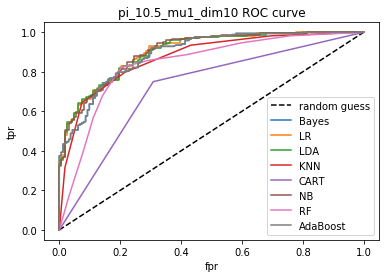

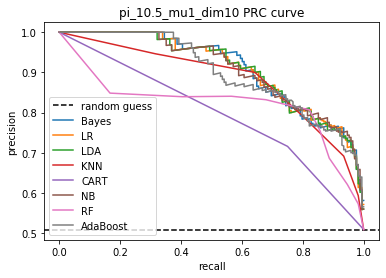

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  LDA
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  AdaBoost


In [90]:
# can tune parameters here and see different results
simulation_results(pi_1 = 0.5, mu = 1, dim = 10, N = 1000)

Positive ratio for pi_1 = 0.1 , mu = 0.2 , dim = 2  is 0.094 .
LR : AUROC = 0.595, AUPRC = 0.176, average precision = 0.094,  . 
Best threshold for ROC = 0.085, accuracy for the best ROC threshold is then 0.536, accuracy = 0.906. 
F1 score = 0.000, log loss = 3.245, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.595, AUPRC = 0.176, average precision = 0.094,  . 
Best threshold for ROC = 0.082, accuracy for the best ROC threshold is then 0.536, accuracy = 0.906. 
F1 score = 0.000, log loss = 3.245, recall = 0.000.
------------------------------------------------------------
KNN : AUROC = 0.509, AUPRC = 0.130, average precision = 0.099,  . 
Best threshold for ROC = 0.200, accuracy for the best ROC threshold is then 0.864, accuracy = 0.900. 
F1 score = 0.057, log loss = 3.454, recall = 0.032.
------------------------------------------------------------
CART : AUROC = 0.499, AUPRC = 0.122, average precision = 0.094,  . 
Best threshold for ROC =

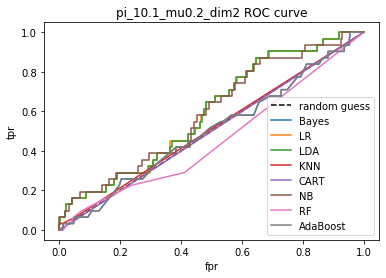

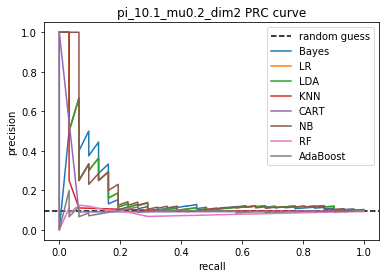

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  KNN
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.2 , dim = 4  is 0.119 .
LR : AUROC = 0.541, AUPRC = 0.125, average precision = 0.118,  . 
Best threshold for ROC = 0.116, accuracy for the best ROC threshold is then 0.533, accuracy = 0.882. 
F1 score = 0.000, log loss = 4.082, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.539, AUPRC = 0.124, average precision = 0.118,  . 
Best threshold for ROC = 0.114, accuracy for the best ROC threshold is then 0.545, accuracy = 0.882. 
F1 score = 0.000, log loss = 4.082, recall = 0.000.
------------------------------------------------------------

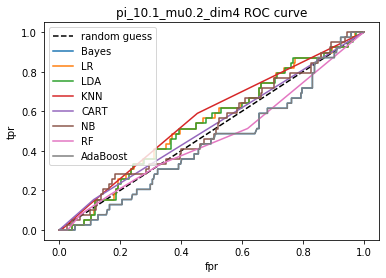

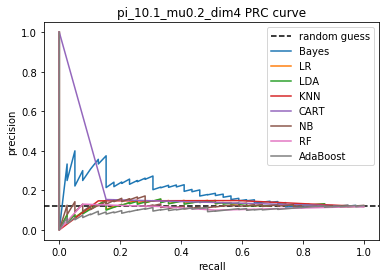

The best model measured by  AUROC is  KNN
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.2 , dim = 6  is 0.105 .
LR : AUROC = 0.563, AUPRC = 0.129, average precision = 0.106,  . 
Best threshold for ROC = 0.094, accuracy for the best ROC threshold is then 0.521, accuracy = 0.894. 
F1 score = 0.000, log loss = 3.663, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.563, AUPRC = 0.128, average precision = 0.106,  . 
Best threshold for ROC = 0.091, accuracy for the best ROC threshold is then 0.521, accuracy = 0.894. 
F1 score = 0.000, log loss = 3.663, recall = 0.000.
--------------------------------------------------------

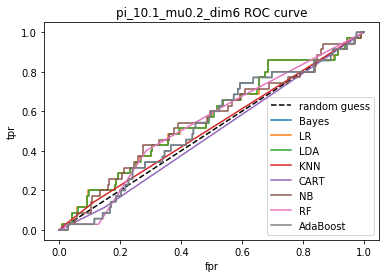

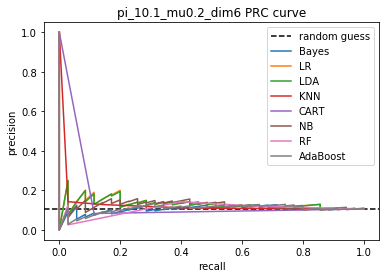

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  KNN
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.2 , dim = 8  is 0.099 .
LR : AUROC = 0.546, AUPRC = 0.108, average precision = 0.100,  . 
Best threshold for ROC = 0.094, accuracy for the best ROC threshold is then 0.530, accuracy = 0.900. 
F1 score = 0.000, log loss = 3.454, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.544, AUPRC = 0.107, average precision = 0.100,  . 
Best threshold for ROC = 0.090, accuracy for the best ROC threshold is then 0.521, accuracy = 0.900. 
F1 score = 0.000, log loss = 3.454, recall = 0.000.
----------------------------------------------------------

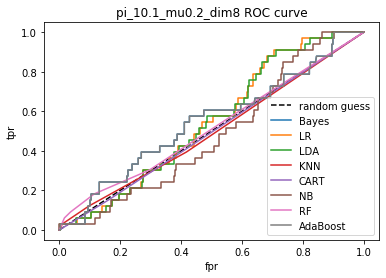

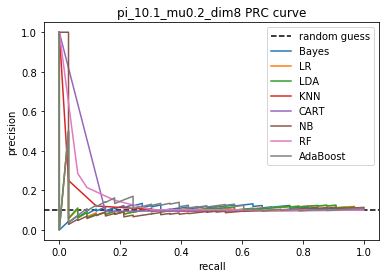

The best model measured by  AUROC is  AdaBoost
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  KNN
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.2 , dim = 10  is 0.106 .
LR : AUROC = 0.474, AUPRC = 0.126, average precision = 0.106,  . 
Best threshold for ROC = 0.092, accuracy for the best ROC threshold is then 0.476, accuracy = 0.894. 
F1 score = 0.000, log loss = 3.663, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.471, AUPRC = 0.125, average precision = 0.106,  . 
Best threshold for ROC = 0.085, accuracy for the best ROC threshold is then 0.439, accuracy = 0.894. 
F1 score = 0.000, log loss = 3.663, recall = 0.000.
---------------------------------------------------

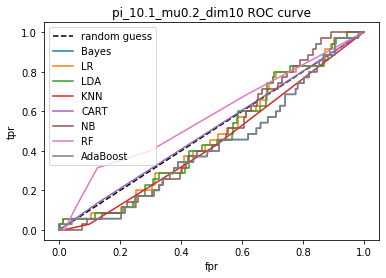

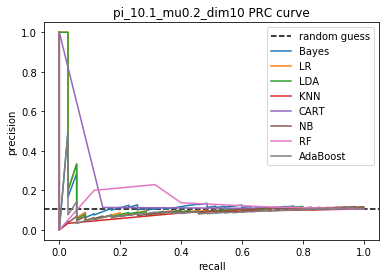

The best model measured by  AUROC is  RF
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.4 , dim = 2  is 0.096 .
LR : AUROC = 0.675, AUPRC = 0.278, average precision = 0.125,  . 
Best threshold for ROC = 0.087, accuracy for the best ROC threshold is then 0.633, accuracy = 0.906. 
F1 score = 0.061, log loss = 3.245, recall = 0.031.
------------------------------------------------------------
LDA : AUROC = 0.677, AUPRC = 0.279, average precision = 0.125,  . 
Best threshold for ROC = 0.080, accuracy for the best ROC threshold is then 0.630, accuracy = 0.906. 
F1 score = 0.061, log loss = 3.245, recall = 0.031.
-----------------------------------------------------

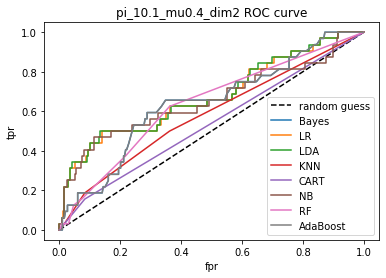

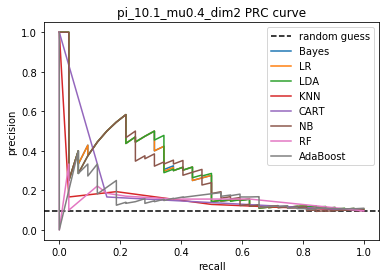

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.4 , dim = 4  is 0.099 .
LR : AUROC = 0.729, AUPRC = 0.223, average precision = 0.100,  . 
Best threshold for ROC = 0.108, accuracy for the best ROC threshold is then 0.648, accuracy = 0.900. 
F1 score = 0.000, log loss = 3.454, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.729, AUPRC = 0.224, average precision = 0.100,  . 
Best threshold for ROC = 0.103, accuracy for the best ROC threshold is then 0.648, accuracy = 0.900. 
F1 score = 0.000, log loss = 3.454, recall = 0.000.
-----------------------------------------------------------

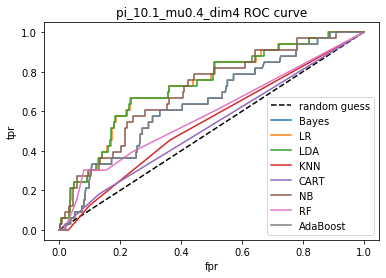

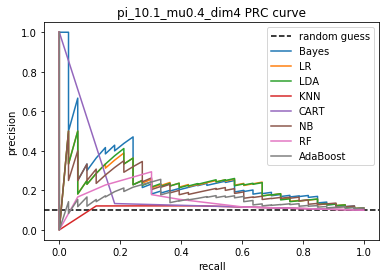

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.4 , dim = 6  is 0.097 .
LR : AUROC = 0.707, AUPRC = 0.195, average precision = 0.097,  . 
Best threshold for ROC = 0.097, accuracy for the best ROC threshold is then 0.648, accuracy = 0.903. 
F1 score = 0.000, log loss = 3.349, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.702, AUPRC = 0.193, average precision = 0.097,  . 
Best threshold for ROC = 0.090, accuracy for the best ROC threshold is then 0.633, accuracy = 0.900. 
F1 score = 0.000, log loss = 3.454, recall = 0.000.
----------------------------------------------------------

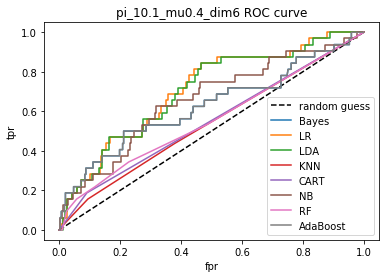

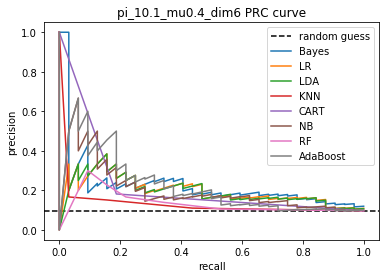

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  AdaBoost
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.4 , dim = 8  is 0.098 .
LR : AUROC = 0.653, AUPRC = 0.154, average precision = 0.097,  . 
Best threshold for ROC = 0.080, accuracy for the best ROC threshold is then 0.579, accuracy = 0.897. 
F1 score = 0.000, log loss = 3.559, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.652, AUPRC = 0.150, average precision = 0.097,  . 
Best threshold for ROC = 0.074, accuracy for the best ROC threshold is then 0.603, accuracy = 0.894. 
F1 score = 0.000, log loss = 3.663, recall = 0.000.
-------------------------------------------------

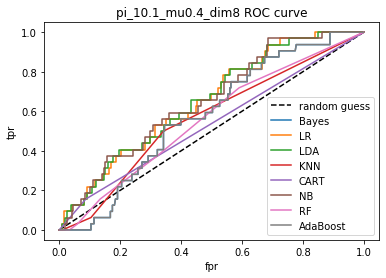

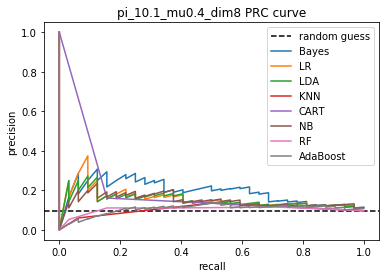

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.4 , dim = 10  is 0.111 .
LR : AUROC = 0.703, AUPRC = 0.188, average precision = 0.112,  . 
Best threshold for ROC = 0.115, accuracy for the best ROC threshold is then 0.645, accuracy = 0.885. 
F1 score = 0.000, log loss = 3.977, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.708, AUPRC = 0.192, average precision = 0.112,  . 
Best threshold for ROC = 0.114, accuracy for the best ROC threshold is then 0.652, accuracy = 0.885. 
F1 score = 0.000, log loss = 3.977, recall = 0.000.
--------------------------------------------------------

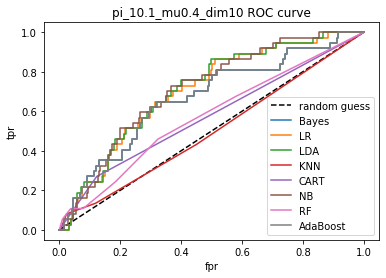

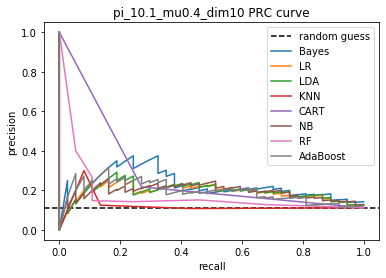

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.6 , dim = 2  is 0.112 .
LR : AUROC = 0.818, AUPRC = 0.300, average precision = 0.113,  . 
Best threshold for ROC = 0.143, accuracy for the best ROC threshold is then 0.761, accuracy = 0.873. 
F1 score = 0.045, log loss = 4.396, recall = 0.027.
------------------------------------------------------------
LDA : AUROC = 0.818, AUPRC = 0.302, average precision = 0.113,  . 
Best threshold for ROC = 0.136, accuracy for the best ROC threshold is then 0.755, accuracy = 0.873. 
F1 score = 0.045, log loss = 4.396, recall = 0.027.
---------------------------------------------------------

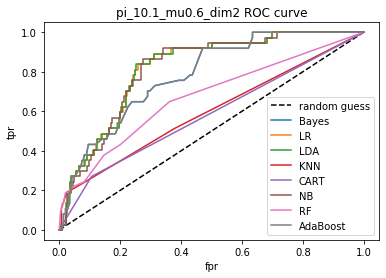

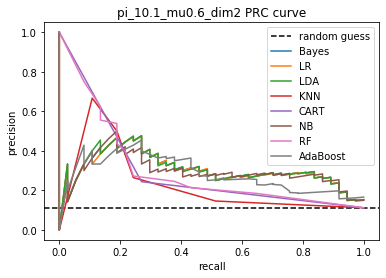

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  KNN
The best model measured by  average_precision is  KNN
The best model measured by  f1 is  KNN
The best model measured by  log_loss_score is  KNN
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.6 , dim = 4  is 0.105 .
LR : AUROC = 0.824, AUPRC = 0.328, average precision = 0.129,  . 
Best threshold for ROC = 0.083, accuracy for the best ROC threshold is then 0.706, accuracy = 0.894. 
F1 score = 0.103, log loss = 3.663, recall = 0.057.
------------------------------------------------------------
LDA : AUROC = 0.830, AUPRC = 0.362, average precision = 0.129,  . 
Best threshold for ROC = 0.078, accuracy for the best ROC threshold is then 0.724, accuracy = 0.894. 
F1 score = 0.103, log loss = 3.663, recall = 0.057.
---------------------------------------------------------

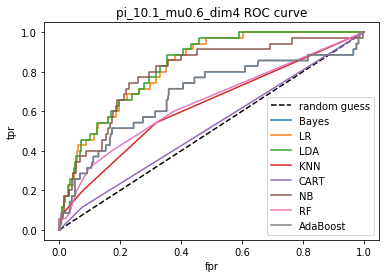

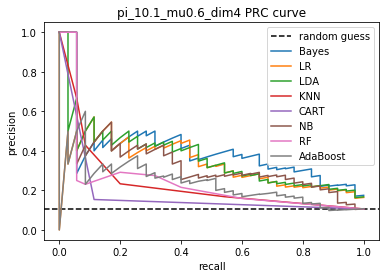

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  KNN
The best model measured by  f1 is  KNN
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.6 , dim = 6  is 0.096 .
LR : AUROC = 0.806, AUPRC = 0.456, average precision = 0.182,  . 
Best threshold for ROC = 0.133, accuracy for the best ROC threshold is then 0.758, accuracy = 0.912. 
F1 score = 0.171, log loss = 3.035, recall = 0.094.
------------------------------------------------------------
LDA : AUROC = 0.803, AUPRC = 0.455, average precision = 0.210,  . 
Best threshold for ROC = 0.117, accuracy for the best ROC threshold is then 0.730, accuracy = 0.915. 
F1 score = 0.222, log loss = 2.931, recall = 0.125.
-----------------------------------------------------------

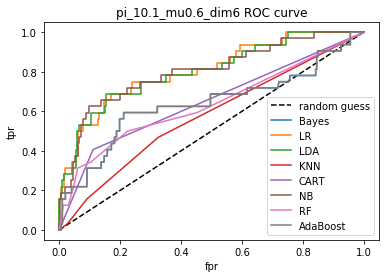

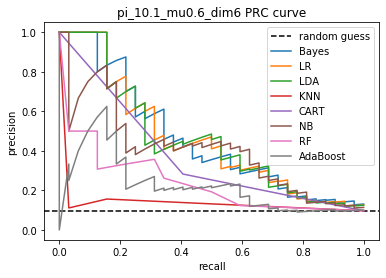

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.6 , dim = 8  is 0.083 .
LR : AUROC = 0.736, AUPRC = 0.288, average precision = 0.125,  . 
Best threshold for ROC = 0.089, accuracy for the best ROC threshold is then 0.739, accuracy = 0.921. 
F1 score = 0.133, log loss = 2.721, recall = 0.074.
------------------------------------------------------------
LDA : AUROC = 0.729, AUPRC = 0.272, average precision = 0.125,  . 
Best threshold for ROC = 0.082, accuracy for the best ROC threshold is then 0.727, accuracy = 0.921. 
F1 score = 0.133, log loss = 2.721, recall = 0.074.
----------------------------------------------------------

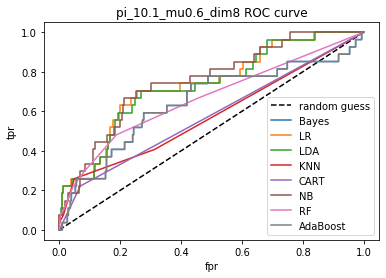

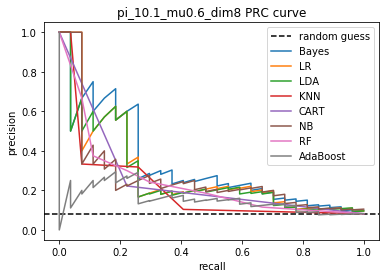

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.6 , dim = 10  is 0.092 .
LR : AUROC = 0.833, AUPRC = 0.331, average precision = 0.145,  . 
Best threshold for ROC = 0.095, accuracy for the best ROC threshold is then 0.758, accuracy = 0.909. 
F1 score = 0.211, log loss = 3.140, recall = 0.133.
------------------------------------------------------------
LDA : AUROC = 0.840, AUPRC = 0.332, average precision = 0.195,  . 
Best threshold for ROC = 0.098, accuracy for the best ROC threshold is then 0.782, accuracy = 0.912. 
F1 score = 0.326, log loss = 3.035, recall = 0.233.
------------------------------------------------------------

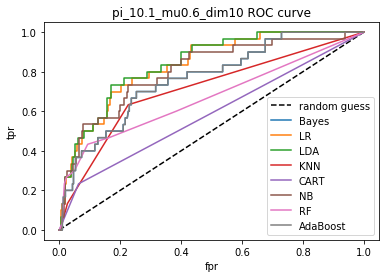

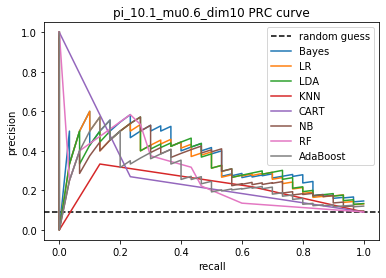

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  RF
The best model measured by  recall is  NB
Positive ratio for pi_1 = 0.1 , mu = 0.8 , dim = 2  is 0.09 .
LR : AUROC = 0.861, AUPRC = 0.414, average precision = 0.195,  . 
Best threshold for ROC = 0.121, accuracy for the best ROC threshold is then 0.797, accuracy = 0.918. 
F1 score = 0.270, log loss = 2.826, recall = 0.167.
------------------------------------------------------------
LDA : AUROC = 0.861, AUPRC = 0.413, average precision = 0.195,  . 
Best threshold for ROC = 0.112, accuracy for the best ROC threshold is then 0.791, accuracy = 0.918. 
F1 score = 0.270, log loss = 2.826, recall = 0.167.
------------------------------------------------------------
KNN

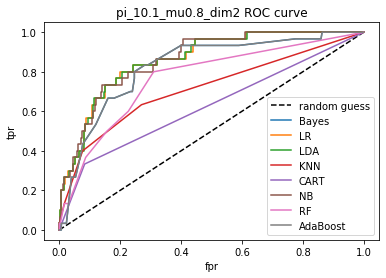

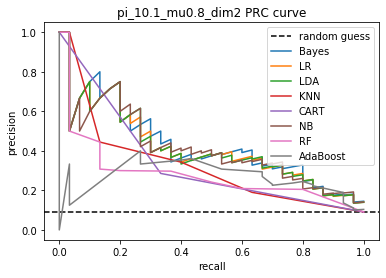

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.8 , dim = 4  is 0.098 .
LR : AUROC = 0.867, AUPRC = 0.506, average precision = 0.246,  . 
Best threshold for ROC = 0.104, accuracy for the best ROC threshold is then 0.806, accuracy = 0.918. 
F1 score = 0.341, log loss = 2.826, recall = 0.219.
------------------------------------------------------------
LDA : AUROC = 0.867, AUPRC = 0.511, average precision = 0.246,  . 
Best threshold for ROC = 0.101, accuracy for the best ROC threshold is then 0.806, accuracy = 0.918. 
F1 score = 0.341, log loss = 2.826, recall = 0.219.
------------------------------------------------------------


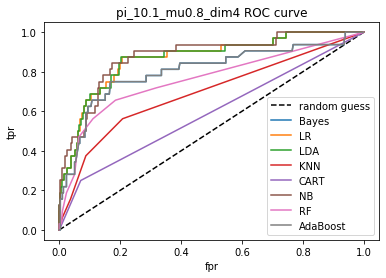

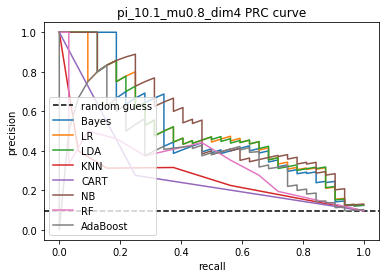

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  NB
Positive ratio for pi_1 = 0.1 , mu = 0.8 , dim = 6  is 0.109 .
LR : AUROC = 0.872, AUPRC = 0.569, average precision = 0.307,  . 
Best threshold for ROC = 0.097, accuracy for the best ROC threshold is then 0.797, accuracy = 0.915. 
F1 score = 0.391, log loss = 2.931, recall = 0.250.
------------------------------------------------------------
LDA : AUROC = 0.878, AUPRC = 0.575, average precision = 0.286,  . 
Best threshold for ROC = 0.084, accuracy for the best ROC threshold is then 0.791, accuracy = 0.912. 
F1 score = 0.383, log loss = 3.035, recall = 0.250.
------------------------------------------------------------
KNN 

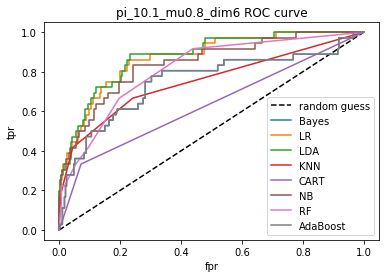

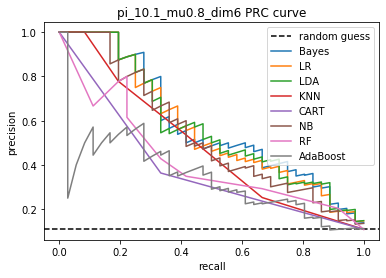

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.8 , dim = 8  is 0.099 .
LR : AUROC = 0.866, AUPRC = 0.373, average precision = 0.135,  . 
Best threshold for ROC = 0.121, accuracy for the best ROC threshold is then 0.809, accuracy = 0.885. 
F1 score = 0.208, log loss = 3.977, recall = 0.152.
------------------------------------------------------------
LDA : AUROC = 0.868, AUPRC = 0.391, average precision = 0.143,  . 
Best threshold for ROC = 0.115, accuracy for the best ROC threshold is then 0.815, accuracy = 0.891. 
F1 score = 0.217, log loss = 3.768, recall = 0.152.
------------------------------------------------------------
K

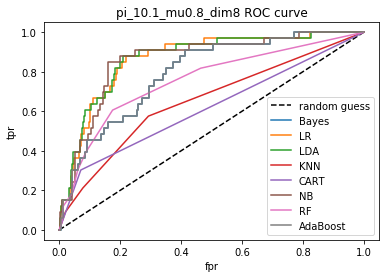

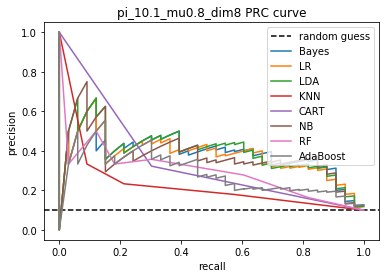

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  RF
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  RF
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.8 , dim = 10  is 0.089 .
LR : AUROC = 0.838, AUPRC = 0.409, average precision = 0.202,  . 
Best threshold for ROC = 0.091, accuracy for the best ROC threshold is then 0.761, accuracy = 0.912. 
F1 score = 0.356, log loss = 3.035, recall = 0.276.
------------------------------------------------------------
LDA : AUROC = 0.837, AUPRC = 0.393, average precision = 0.197,  . 
Best threshold for ROC = 0.086, accuracy for the best ROC threshold is then 0.767, accuracy = 0.915. 
F1 score = 0.333, log loss = 2.931, recall = 0.241.
--------------------------------------------------------

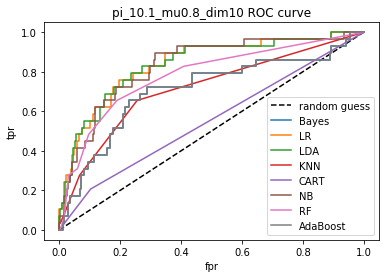

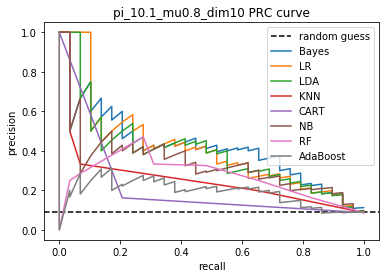

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.1 , mu = 1 , dim = 2  is 0.085 .
LR : AUROC = 0.939, AUPRC = 0.629, average precision = 0.322,  . 
Best threshold for ROC = 0.153, accuracy for the best ROC threshold is then 0.882, accuracy = 0.933. 
F1 score = 0.500, log loss = 2.303, recall = 0.393.
------------------------------------------------------------
LDA : AUROC = 0.938, AUPRC = 0.626, average precision = 0.310,  . 
Best threshold for ROC = 0.146, accuracy for the best ROC threshold is then 0.882, accuracy = 0.933. 
F1 score = 0.476, log loss = 2.303, recall = 0.357.
------------------------------------------------------------
KNN 

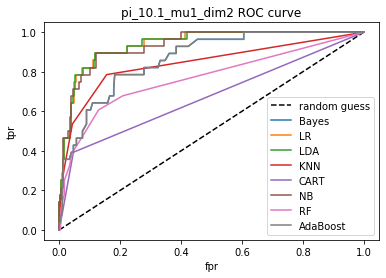

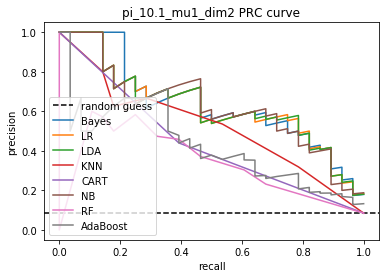

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.1 , mu = 1 , dim = 4  is 0.107 .
LR : AUROC = 0.956, AUPRC = 0.692, average precision = 0.390,  . 
Best threshold for ROC = 0.162, accuracy for the best ROC threshold is then 0.885, accuracy = 0.924. 
F1 score = 0.561, log loss = 2.617, recall = 0.457.
------------------------------------------------------------
LDA : AUROC = 0.956, AUPRC = 0.706, average precision = 0.406,  . 
Best threshold for ROC = 0.201, accuracy for the best ROC threshold is then 0.900, accuracy = 0.927. 
F1 score = 0.571, log loss = 2.512, recall = 0.457.
------------------------------------------------------------
KNN : 

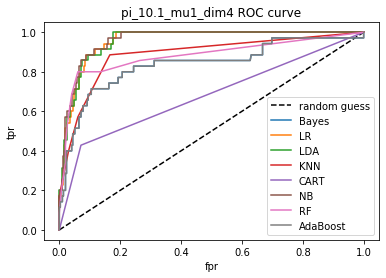

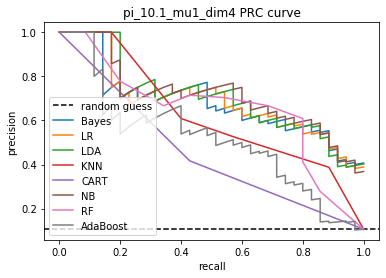

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  RF
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  NB
Positive ratio for pi_1 = 0.1 , mu = 1 , dim = 6  is 0.094 .
LR : AUROC = 0.946, AUPRC = 0.645, average precision = 0.302,  . 
Best threshold for ROC = 0.152, accuracy for the best ROC threshold is then 0.873, accuracy = 0.918. 
F1 score = 0.491, log loss = 2.826, recall = 0.419.
------------------------------------------------------------
LDA : AUROC = 0.948, AUPRC = 0.651, average precision = 0.269,  . 
Best threshold for ROC = 0.155, accuracy for the best ROC threshold is then 0.888, accuracy = 0.912. 
F1 score = 0.453, log loss = 3.035, recall = 0.387.
------------------------------------------------------------
KNN : 

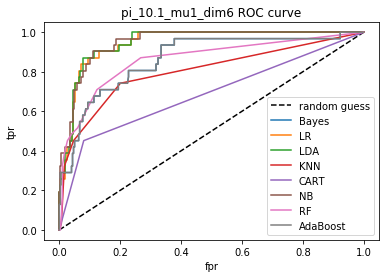

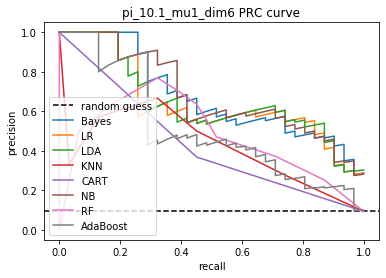

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  RF
The best model measured by  average_precision is  RF
The best model measured by  f1 is  RF
The best model measured by  log_loss_score is  RF
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 1 , dim = 8  is 0.103 .
LR : AUROC = 0.926, AUPRC = 0.659, average precision = 0.335,  . 
Best threshold for ROC = 0.120, accuracy for the best ROC threshold is then 0.839, accuracy = 0.918. 
F1 score = 0.509, log loss = 2.826, recall = 0.412.
------------------------------------------------------------
LDA : AUROC = 0.933, AUPRC = 0.675, average precision = 0.323,  . 
Best threshold for ROC = 0.125, accuracy for the best ROC threshold is then 0.845, accuracy = 0.915. 
F1 score = 0.500, log loss = 2.931, recall = 0.412.
------------------------------------------------------------
KNN :

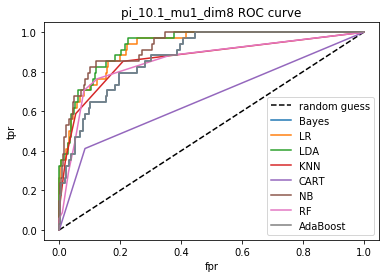

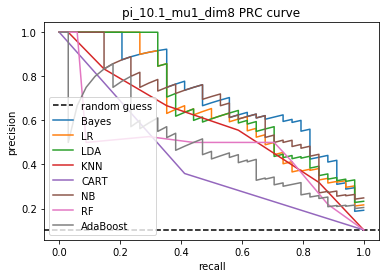

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  NB
Positive ratio for pi_1 = 0.1 , mu = 1 , dim = 10  is 0.09 .
LR : AUROC = 0.916, AUPRC = 0.679, average precision = 0.420,  . 
Best threshold for ROC = 0.128, accuracy for the best ROC threshold is then 0.824, accuracy = 0.939. 
F1 score = 0.600, log loss = 2.093, recall = 0.500.
------------------------------------------------------------
LDA : AUROC = 0.918, AUPRC = 0.675, average precision = 0.403,  . 
Best threshold for ROC = 0.098, accuracy for the best ROC threshold is then 0.803, accuracy = 0.936. 
F1 score = 0.588, log loss = 2.198, recall = 0.500.
------------------------------------------------------------
KNN :

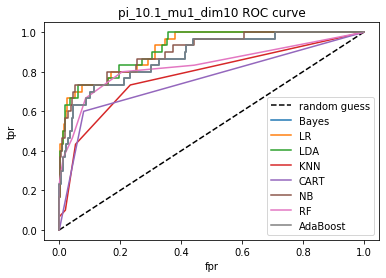

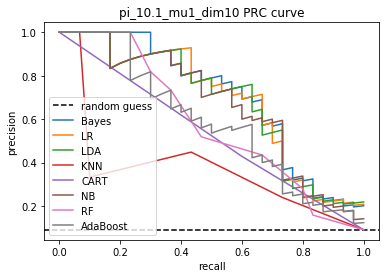

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.2 , dim = 2  is 0.195 .
LR : AUROC = 0.550, AUPRC = 0.239, average precision = 0.194,  . 
Best threshold for ROC = 0.202, accuracy for the best ROC threshold is then 0.545, accuracy = 0.806. 
F1 score = 0.000, log loss = 6.698, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.551, AUPRC = 0.239, average precision = 0.194,  . 
Best threshold for ROC = 0.200, accuracy for the best ROC threshold is then 0.542, accuracy = 0.806. 
F1 score = 0.000, log loss = 6.698, recall = 0.000.
------------------------------------------------------------
K

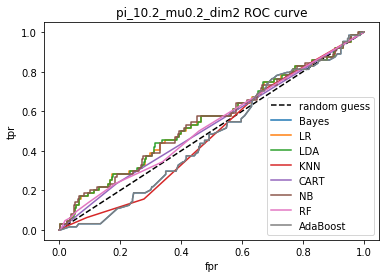

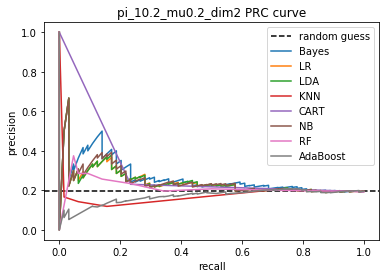

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.2 , dim = 4  is 0.197 .
LR : AUROC = 0.623, AUPRC = 0.264, average precision = 0.197,  . 
Best threshold for ROC = 0.207, accuracy for the best ROC threshold is then 0.588, accuracy = 0.803. 
F1 score = 0.000, log loss = 6.803, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.623, AUPRC = 0.265, average precision = 0.197,  . 
Best threshold for ROC = 0.205, accuracy for the best ROC threshold is then 0.588, accuracy = 0.803. 
F1 score = 0.000, log loss = 6.803, recall = 0.000.
--------------------------------------------------------

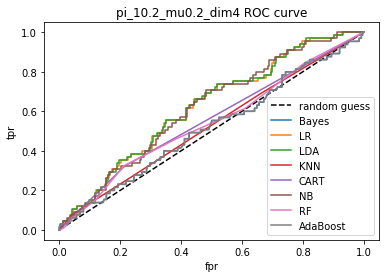

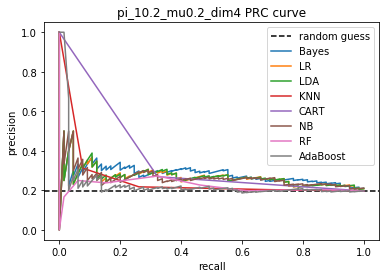

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.2 , dim = 6  is 0.218 .
LR : AUROC = 0.629, AUPRC = 0.319, average precision = 0.218,  . 
Best threshold for ROC = 0.222, accuracy for the best ROC threshold is then 0.600, accuracy = 0.782. 
F1 score = 0.000, log loss = 7.536, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.629, AUPRC = 0.320, average precision = 0.218,  . 
Best threshold for ROC = 0.219, accuracy for the best ROC threshold is then 0.591, accuracy = 0.782. 
F1 score = 0.000, log loss = 7.536, recall = 0.000.
--------------------------------------------------------

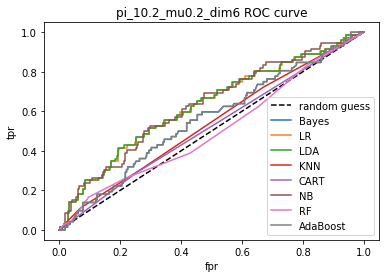

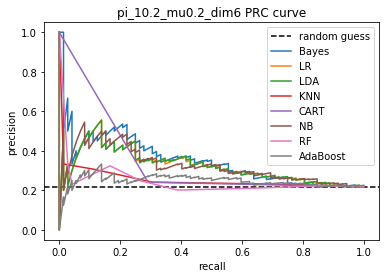

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  KNN
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.2 , dim = 8  is 0.217 .
LR : AUROC = 0.594, AUPRC = 0.286, average precision = 0.218,  . 
Best threshold for ROC = 0.213, accuracy for the best ROC threshold is then 0.564, accuracy = 0.782. 
F1 score = 0.000, log loss = 7.536, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.595, AUPRC = 0.286, average precision = 0.218,  . 
Best threshold for ROC = 0.211, accuracy for the best ROC threshold is then 0.564, accuracy = 0.782. 
F1 score = 0.000, log loss = 7.536, recall = 0.000.
----------------------------------------------------------

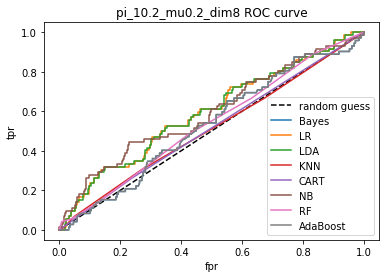

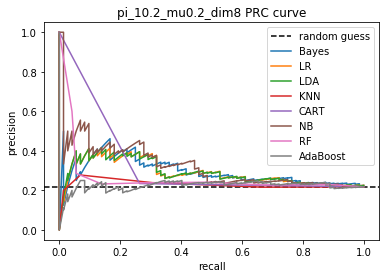

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  NB
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.2 , dim = 10  is 0.195 .
LR : AUROC = 0.588, AUPRC = 0.232, average precision = 0.194,  . 
Best threshold for ROC = 0.194, accuracy for the best ROC threshold is then 0.576, accuracy = 0.806. 
F1 score = 0.000, log loss = 6.698, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.588, AUPRC = 0.233, average precision = 0.194,  . 
Best threshold for ROC = 0.192, accuracy for the best ROC threshold is then 0.573, accuracy = 0.806. 
F1 score = 0.000, log loss = 6.698, recall = 0.000.
---------------------------------------------------------

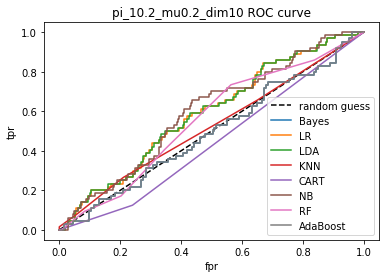

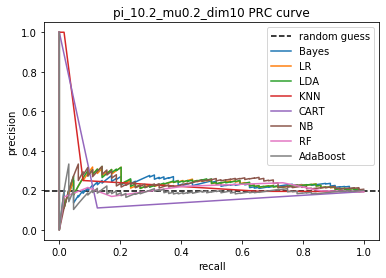

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  KNN
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  KNN
The best model measured by  f1 is  KNN
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.4 , dim = 2  is 0.219 .
LR : AUROC = 0.761, AUPRC = 0.454, average precision = 0.265,  . 
Best threshold for ROC = 0.253, accuracy for the best ROC threshold is then 0.758, accuracy = 0.782. 
F1 score = 0.250, log loss = 7.536, recall = 0.167.
------------------------------------------------------------
LDA : AUROC = 0.761, AUPRC = 0.457, average precision = 0.261,  . 
Best threshold for ROC = 0.251, accuracy for the best ROC threshold is then 0.758, accuracy = 0.782. 
F1 score = 0.234, log loss = 7.536, recall = 0.153.
------------------------------------------------------------

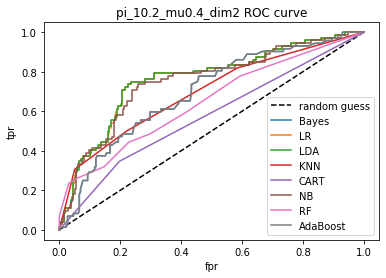

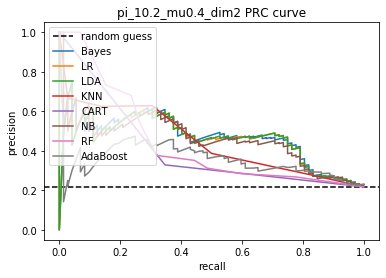

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  KNN
The best model measured by  average_precision is  KNN
The best model measured by  f1 is  KNN
The best model measured by  log_loss_score is  KNN
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.4 , dim = 4  is 0.169 .
LR : AUROC = 0.790, AUPRC = 0.464, average precision = 0.210,  . 
Best threshold for ROC = 0.197, accuracy for the best ROC threshold is then 0.703, accuracy = 0.836. 
F1 score = 0.156, log loss = 5.652, recall = 0.089.
------------------------------------------------------------
LDA : AUROC = 0.791, AUPRC = 0.464, average precision = 0.210,  . 
Best threshold for ROC = 0.196, accuracy for the best ROC threshold is then 0.706, accuracy = 0.836. 
F1 score = 0.156, log loss = 5.652, recall = 0.089.
----------------------------------------------------------

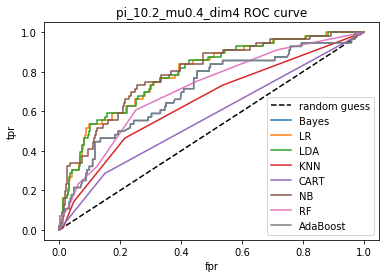

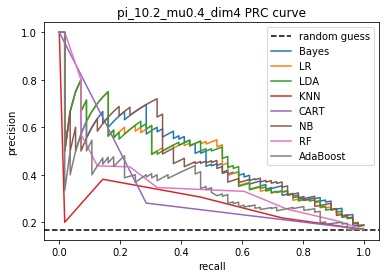

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.4 , dim = 6  is 0.2 .
LR : AUROC = 0.732, AUPRC = 0.456, average precision = 0.200,  . 
Best threshold for ROC = 0.211, accuracy for the best ROC threshold is then 0.682, accuracy = 0.800. 
F1 score = 0.000, log loss = 6.908, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.731, AUPRC = 0.452, average precision = 0.212,  . 
Best threshold for ROC = 0.204, accuracy for the best ROC threshold is then 0.661, accuracy = 0.803. 
F1 score = 0.030, log loss = 6.803, recall = 0.015.
--------------------------------------------------------

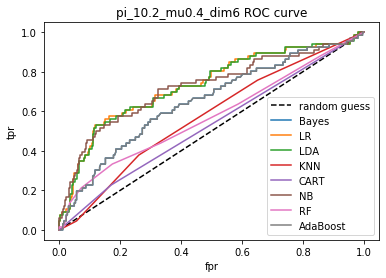

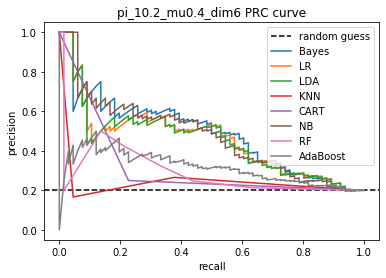

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  RF
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.4 , dim = 8  is 0.222 .
LR : AUROC = 0.720, AUPRC = 0.379, average precision = 0.241,  . 
Best threshold for ROC = 0.229, accuracy for the best ROC threshold is then 0.652, accuracy = 0.776. 
F1 score = 0.140, log loss = 7.745, recall = 0.082.
------------------------------------------------------------
LDA : AUROC = 0.719, AUPRC = 0.377, average precision = 0.241,  . 
Best threshold for ROC = 0.228, accuracy for the best ROC threshold is then 0.655, accuracy = 0.776. 
F1 score = 0.140, log loss = 7.745, recall = 0.082.
------------------------------------------------------------


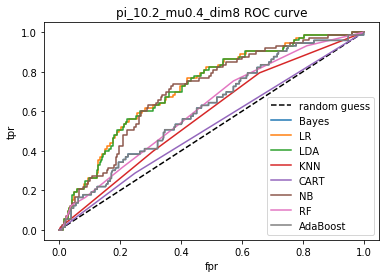

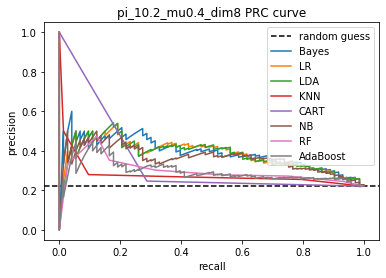

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  RF
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.4 , dim = 10  is 0.233 .
LR : AUROC = 0.696, AUPRC = 0.498, average precision = 0.332,  . 
Best threshold for ROC = 0.235, accuracy for the best ROC threshold is then 0.603, accuracy = 0.794. 
F1 score = 0.333, log loss = 7.117, recall = 0.221.
------------------------------------------------------------
LDA : AUROC = 0.695, AUPRC = 0.494, average precision = 0.332,  . 
Best threshold for ROC = 0.229, accuracy for the best ROC threshold is then 0.603, accuracy = 0.794. 
F1 score = 0.333, log loss = 7.117, recall = 0.221.
------------------------------------------------------------

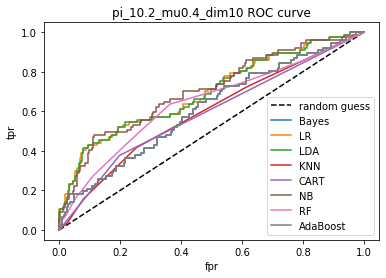

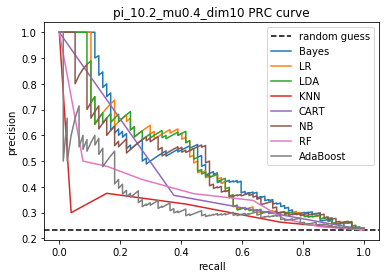

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.6 , dim = 2  is 0.182 .
LR : AUROC = 0.767, AUPRC = 0.457, average precision = 0.260,  . 
Best threshold for ROC = 0.175, accuracy for the best ROC threshold is then 0.688, accuracy = 0.824. 
F1 score = 0.310, log loss = 6.070, recall = 0.217.
------------------------------------------------------------
LDA : AUROC = 0.766, AUPRC = 0.451, average precision = 0.265,  . 
Best threshold for ROC = 0.169, accuracy for the best ROC threshold is then 0.682, accuracy = 0.827. 
F1 score = 0.313, log loss = 5.966, recall = 0.217.
------------------------------------------------------------


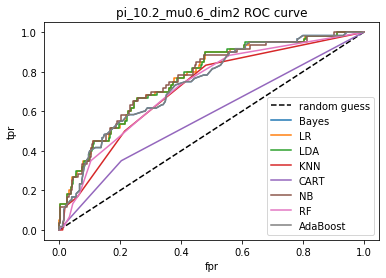

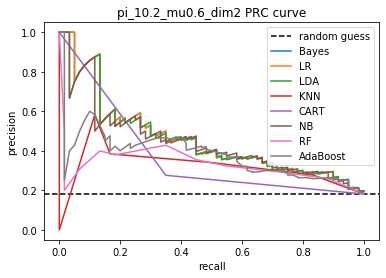

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.6 , dim = 4  is 0.179 .
LR : AUROC = 0.791, AUPRC = 0.493, average precision = 0.299,  . 
Best threshold for ROC = 0.190, accuracy for the best ROC threshold is then 0.736, accuracy = 0.845. 
F1 score = 0.338, log loss = 5.338, recall = 0.220.
------------------------------------------------------------
LDA : AUROC = 0.791, AUPRC = 0.493, average precision = 0.299,  . 
Best threshold for ROC = 0.188, accuracy for the best ROC threshold is then 0.739, accuracy = 0.845. 
F1 score = 0.338, log loss = 5.338, recall = 0.220.
-----------------------------------------------------------

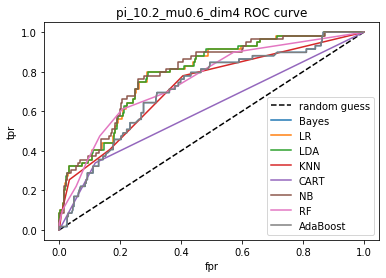

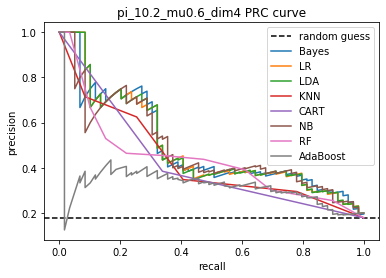

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  NB
The best model measured by  f1 is  KNN
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.6 , dim = 6  is 0.181 .
LR : AUROC = 0.824, AUPRC = 0.521, average precision = 0.343,  . 
Best threshold for ROC = 0.161, accuracy for the best ROC threshold is then 0.730, accuracy = 0.848. 
F1 score = 0.444, log loss = 5.233, recall = 0.333.
------------------------------------------------------------
LDA : AUROC = 0.827, AUPRC = 0.519, average precision = 0.351,  . 
Best threshold for ROC = 0.163, accuracy for the best ROC threshold is then 0.736, accuracy = 0.852. 
F1 score = 0.449, log loss = 5.129, recall = 0.333.
------------------------------------------------------------


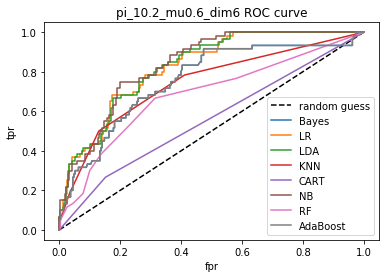

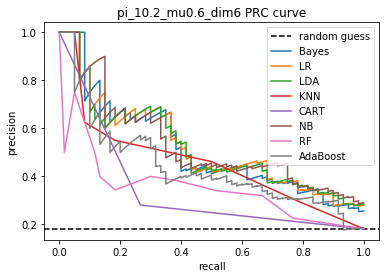

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  AdaBoost
Positive ratio for pi_1 = 0.2 , mu = 0.6 , dim = 8  is 0.202 .
LR : AUROC = 0.790, AUPRC = 0.526, average precision = 0.362,  . 
Best threshold for ROC = 0.174, accuracy for the best ROC threshold is then 0.688, accuracy = 0.833. 
F1 score = 0.444, log loss = 5.756, recall = 0.328.
------------------------------------------------------------
LDA : AUROC = 0.789, AUPRC = 0.525, average precision = 0.352,  . 
Best threshold for ROC = 0.182, accuracy for the best ROC threshold is then 0.703, accuracy = 0.830. 
F1 score = 0.429, log loss = 5.861, recall = 0.313.
-------------------------------------------------------

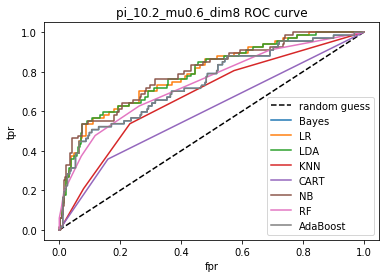

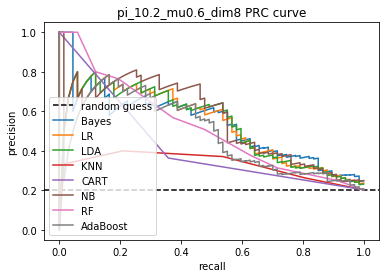

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  RF
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.6 , dim = 10  is 0.19 .
LR : AUROC = 0.798, AUPRC = 0.531, average precision = 0.288,  . 
Best threshold for ROC = 0.190, accuracy for the best ROC threshold is then 0.733, accuracy = 0.824. 
F1 score = 0.341, log loss = 6.070, recall = 0.238.
------------------------------------------------------------
LDA : AUROC = 0.799, AUPRC = 0.533, average precision = 0.294,  . 
Best threshold for ROC = 0.185, accuracy for the best ROC threshold is then 0.730, accuracy = 0.827. 
F1 score = 0.345, log loss = 5.966, recall = 0.238.
------------------------------------------------------------
KNN 

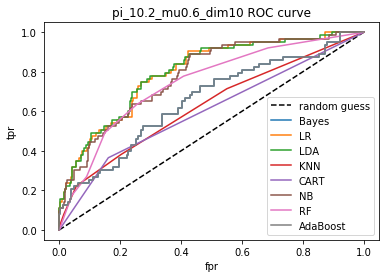

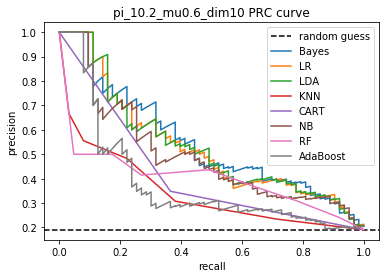

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.8 , dim = 2  is 0.2 .
LR : AUROC = 0.830, AUPRC = 0.582, average precision = 0.379,  . 
Best threshold for ROC = 0.196, accuracy for the best ROC threshold is then 0.764, accuracy = 0.833. 
F1 score = 0.505, log loss = 5.757, recall = 0.424.
------------------------------------------------------------
LDA : AUROC = 0.831, AUPRC = 0.578, average precision = 0.379,  . 
Best threshold for ROC = 0.199, accuracy for the best ROC threshold is then 0.773, accuracy = 0.833. 
F1 score = 0.505, log loss = 5.757, recall = 0.424.
------------------------------------------------------------
KN

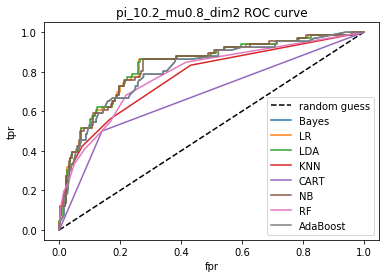

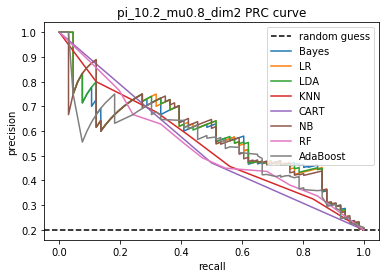

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  AdaBoost
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  AdaBoost
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.8 , dim = 4  is 0.211 .
LR : AUROC = 0.868, AUPRC = 0.686, average precision = 0.491,  . 
Best threshold for ROC = 0.219, accuracy for the best ROC threshold is then 0.788, accuracy = 0.855. 
F1 score = 0.636, log loss = 5.024, recall = 0.600.
------------------------------------------------------------
LDA : AUROC = 0.869, AUPRC = 0.686, average precision = 0.491,  . 
Best threshold for ROC = 0.216, accuracy for the best ROC threshold is then 0.788, accuracy = 0.855. 
F1 score = 0.636, log loss = 5.024, recall = 0.600.
--------------------------------------------

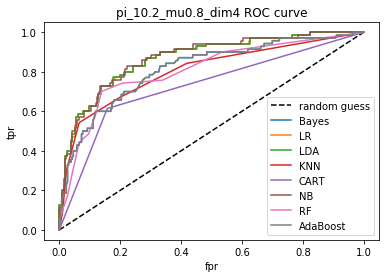

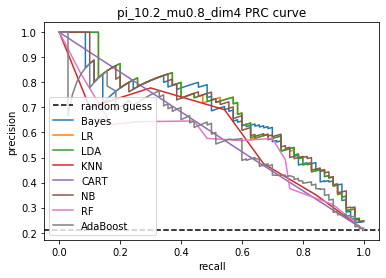

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.8 , dim = 6  is 0.207 .
LR : AUROC = 0.785, AUPRC = 0.451, average precision = 0.328,  . 
Best threshold for ROC = 0.171, accuracy for the best ROC threshold is then 0.703, accuracy = 0.815. 
F1 score = 0.408, log loss = 6.384, recall = 0.309.
------------------------------------------------------------
LDA : AUROC = 0.786, AUPRC = 0.450, average precision = 0.296,  . 
Best threshold for ROC = 0.169, accuracy for the best ROC threshold is then 0.700, accuracy = 0.806. 
F1 score = 0.347, log loss = 6.698, recall = 0.250.
------------------------------------------------------------
KN

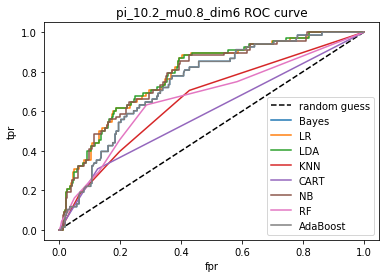

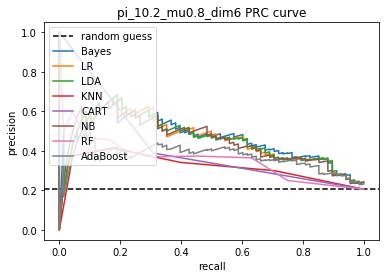

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.2 , mu = 0.8 , dim = 8  is 0.198 .
LR : AUROC = 0.877, AUPRC = 0.684, average precision = 0.393,  . 
Best threshold for ROC = 0.208, accuracy for the best ROC threshold is then 0.806, accuracy = 0.848. 
F1 score = 0.490, log loss = 5.233, recall = 0.369.
------------------------------------------------------------
LDA : AUROC = 0.877, AUPRC = 0.683, average precision = 0.418,  . 
Best threshold for ROC = 0.198, accuracy for the best ROC threshold is then 0.803, accuracy = 0.855. 
F1 score = 0.529, log loss = 5.024, recall = 0.415.
------------------------------------------------------------
KNN

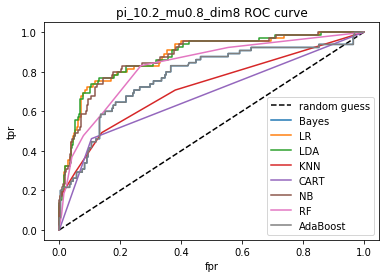

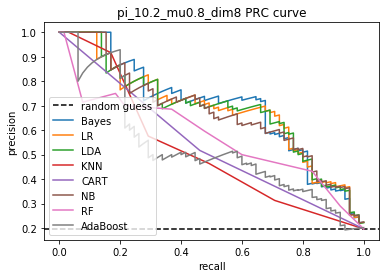

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.8 , dim = 10  is 0.206 .
LR : AUROC = 0.809, AUPRC = 0.603, average precision = 0.403,  . 
Best threshold for ROC = 0.158, accuracy for the best ROC threshold is then 0.742, accuracy = 0.842. 
F1 score = 0.500, log loss = 5.442, recall = 0.382.
------------------------------------------------------------
LDA : AUROC = 0.808, AUPRC = 0.598, average precision = 0.396,  . 
Best threshold for ROC = 0.132, accuracy for the best ROC threshold is then 0.730, accuracy = 0.839. 
F1 score = 0.495, log loss = 5.547, recall = 0.382.
------------------------------------------------------------

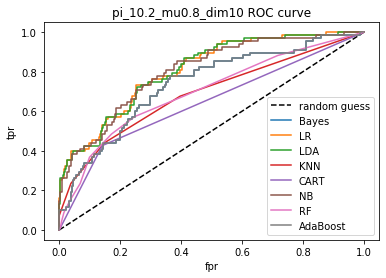

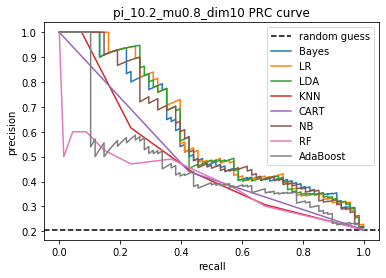

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 1 , dim = 2  is 0.219 .
LR : AUROC = 0.918, AUPRC = 0.799, average precision = 0.597,  . 
Best threshold for ROC = 0.232, accuracy for the best ROC threshold is then 0.833, accuracy = 0.888. 
F1 score = 0.722, log loss = 3.873, recall = 0.667.
------------------------------------------------------------
LDA : AUROC = 0.918, AUPRC = 0.798, average precision = 0.597,  . 
Best threshold for ROC = 0.218, accuracy for the best ROC threshold is then 0.833, accuracy = 0.888. 
F1 score = 0.722, log loss = 3.873, recall = 0.667.
------------------------------------------------------------
KNN 

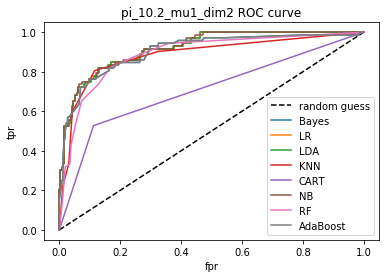

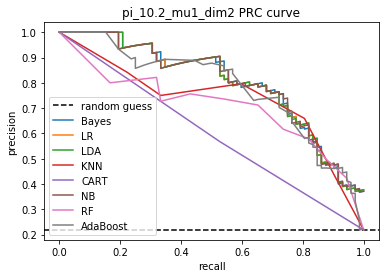

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  NB
Positive ratio for pi_1 = 0.2 , mu = 1 , dim = 4  is 0.188 .
LR : AUROC = 0.941, AUPRC = 0.792, average precision = 0.514,  . 
Best threshold for ROC = 0.223, accuracy for the best ROC threshold is then 0.858, accuracy = 0.888. 
F1 score = 0.634, log loss = 3.873, recall = 0.516.
------------------------------------------------------------
LDA : AUROC = 0.941, AUPRC = 0.791, average precision = 0.540,  . 
Best threshold for ROC = 0.218, accuracy for the best ROC threshold is then 0.861, accuracy = 0.894. 
F1 score = 0.660, log loss = 3.663, recall = 0.548.
------------------------------------------------------------
KNN : A

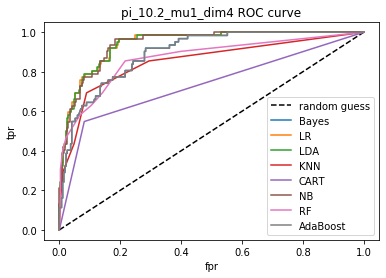

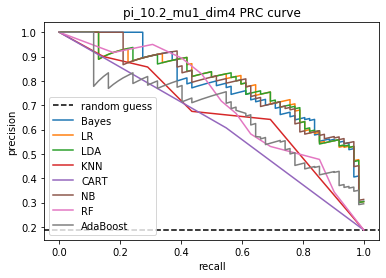

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  LDA
Positive ratio for pi_1 = 0.2 , mu = 1 , dim = 6  is 0.211 .
LR : AUROC = 0.893, AUPRC = 0.729, average precision = 0.475,  . 
Best threshold for ROC = 0.196, accuracy for the best ROC threshold is then 0.812, accuracy = 0.852. 
F1 score = 0.614, log loss = 5.129, recall = 0.557.
------------------------------------------------------------
LDA : AUROC = 0.895, AUPRC = 0.737, average precision = 0.472,  . 
Best threshold for ROC = 0.198, accuracy for the best ROC threshold is then 0.821, accuracy = 0.852. 
F1 score = 0.608, log loss = 5.129, recall = 0.543.
------------------------------------------------------------
KN

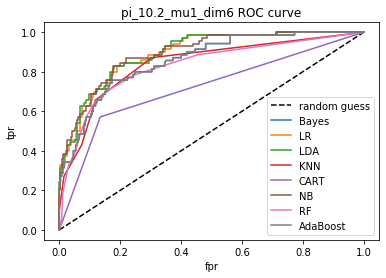

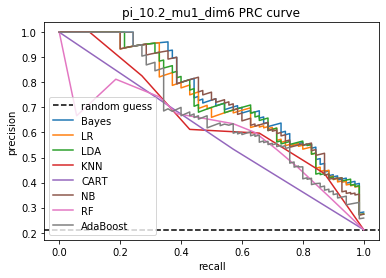

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 1 , dim = 8  is 0.212 .
LR : AUROC = 0.911, AUPRC = 0.756, average precision = 0.535,  . 
Best threshold for ROC = 0.282, accuracy for the best ROC threshold is then 0.861, accuracy = 0.870. 
F1 score = 0.677, log loss = 4.501, recall = 0.643.
------------------------------------------------------------
LDA : AUROC = 0.913, AUPRC = 0.766, average precision = 0.563,  . 
Best threshold for ROC = 0.256, accuracy for the best ROC threshold is then 0.855, accuracy = 0.879. 
F1 score = 0.701, log loss = 4.187, recall = 0.671.
------------------------------------------------------------
KNN 

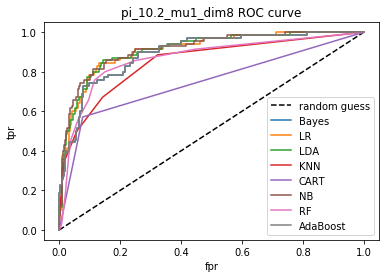

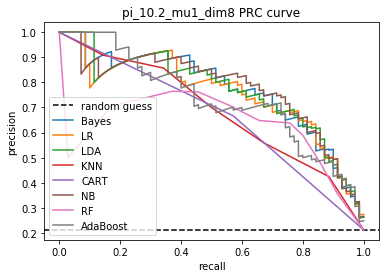

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  LDA
Positive ratio for pi_1 = 0.2 , mu = 1 , dim = 10  is 0.202 .
LR : AUROC = 0.910, AUPRC = 0.773, average precision = 0.549,  . 
Best threshold for ROC = 0.239, accuracy for the best ROC threshold is then 0.803, accuracy = 0.882. 
F1 score = 0.688, log loss = 4.082, recall = 0.642.
------------------------------------------------------------
LDA : AUROC = 0.910, AUPRC = 0.778, average precision = 0.533,  . 
Best threshold for ROC = 0.238, accuracy for the best ROC threshold is then 0.818, accuracy = 0.876. 
F1 score = 0.677, log loss = 4.291, recall = 0.642.
------------------------------------------------------------
KNN :

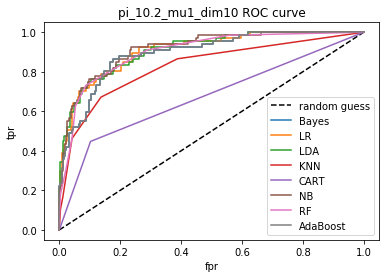

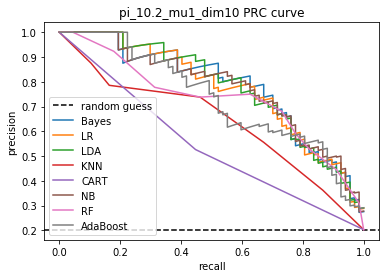

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.3 , mu = 0.2 , dim = 2  is 0.277 .
LR : AUROC = 0.611, AUPRC = 0.360, average precision = 0.291,  . 
Best threshold for ROC = 0.271, accuracy for the best ROC threshold is then 0.582, accuracy = 0.724. 
F1 score = 0.117, log loss = 9.524, recall = 0.066.
------------------------------------------------------------
LDA : AUROC = 0.611, AUPRC = 0.360, average precision = 0.288,  . 
Best threshold for ROC = 0.268, accuracy for the best ROC threshold is then 0.582, accuracy = 0.721. 
F1 score = 0.115, log loss = 9.629, recall = 0.066.
------------------------------------------------------------
KNN 

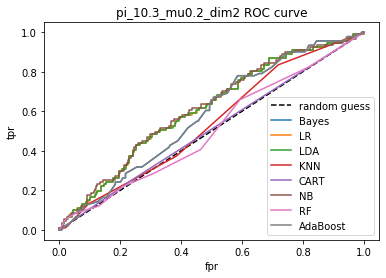

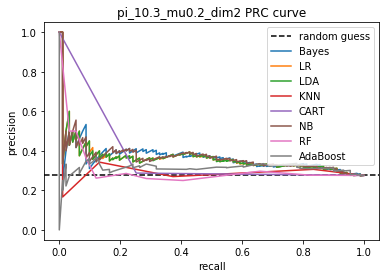

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.3 , mu = 0.2 , dim = 4  is 0.282 .
LR : AUROC = 0.591, AUPRC = 0.405, average precision = 0.282,  . 
Best threshold for ROC = 0.271, accuracy for the best ROC threshold is then 0.552, accuracy = 0.718. 
F1 score = 0.000, log loss = 9.734, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.591, AUPRC = 0.405, average precision = 0.282,  . 
Best threshold for ROC = 0.269, accuracy for the best ROC threshold is then 0.552, accuracy = 0.718. 
F1 score = 0.000, log loss = 9.734, recall = 0.000.
-----------------------------------------------------------

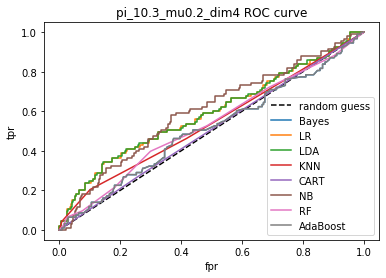

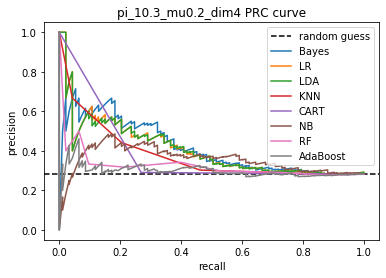

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  KNN
The best model measured by  f1 is  KNN
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.3 , mu = 0.2 , dim = 6  is 0.291 .
LR : AUROC = 0.618, AUPRC = 0.384, average precision = 0.291,  . 
Best threshold for ROC = 0.293, accuracy for the best ROC threshold is then 0.567, accuracy = 0.709. 
F1 score = 0.000, log loss = 10.048, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.617, AUPRC = 0.383, average precision = 0.291,  . 
Best threshold for ROC = 0.292, accuracy for the best ROC threshold is then 0.564, accuracy = 0.709. 
F1 score = 0.000, log loss = 10.048, recall = 0.000.
-----------------------------------------------------------

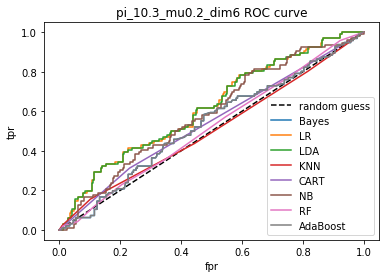

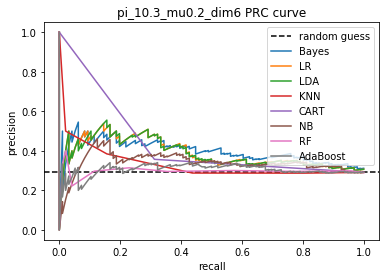

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.3 , mu = 0.2 , dim = 8  is 0.276 .
LR : AUROC = 0.524, AUPRC = 0.293, average precision = 0.276,  . 
Best threshold for ROC = 0.281, accuracy for the best ROC threshold is then 0.524, accuracy = 0.715. 
F1 score = 0.000, log loss = 9.838, recall = 0.000.
------------------------------------------------------------
LDA : AUROC = 0.525, AUPRC = 0.294, average precision = 0.276,  . 
Best threshold for ROC = 0.279, accuracy for the best ROC threshold is then 0.524, accuracy = 0.715. 
F1 score = 0.000, log loss = 9.838, recall = 0.000.
---------------------------------------------------------

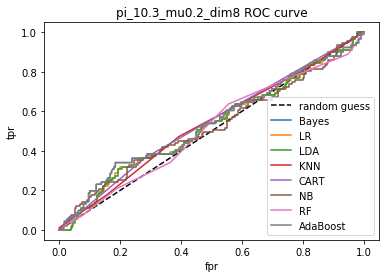

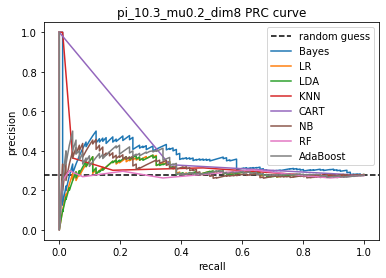

The best model measured by  AUROC is  CART
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.3 , mu = 0.2 , dim = 10  is 0.314 .
LR : AUROC = 0.525, AUPRC = 0.329, average precision = 0.320,  . 
Best threshold for ROC = 0.318, accuracy for the best ROC threshold is then 0.497, accuracy = 0.676. 
F1 score = 0.101, log loss = 11.199, recall = 0.058.
------------------------------------------------------------
LDA : AUROC = 0.525, AUPRC = 0.330, average precision = 0.322,  . 
Best threshold for ROC = 0.316, accuracy for the best ROC threshold is then 0.500, accuracy = 0.679. 
F1 score = 0.102, log loss = 11.094, recall = 0.058.
------------------------------------------------

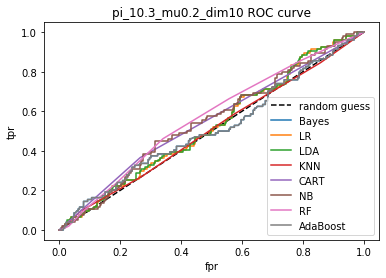

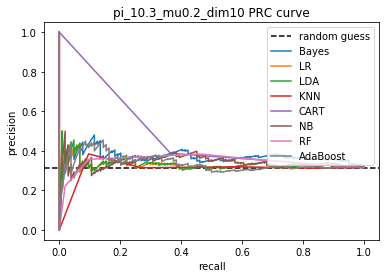

The best model measured by  AUROC is  RF
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.3 , mu = 0.4 , dim = 2  is 0.311 .
LR : AUROC = 0.702, AUPRC = 0.513, average precision = 0.389,  . 
Best threshold for ROC = 0.326, accuracy for the best ROC threshold is then 0.645, accuracy = 0.715. 
F1 score = 0.373, log loss = 9.838, recall = 0.272.
------------------------------------------------------------
LDA : AUROC = 0.702, AUPRC = 0.513, average precision = 0.389,  . 
Best threshold for ROC = 0.324, accuracy for the best ROC threshold is then 0.645, accuracy = 0.715. 
F1 score = 0.373, log loss = 9.838, recall = 0.272.
-------------------------------------------------------

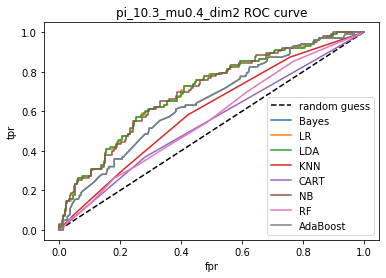

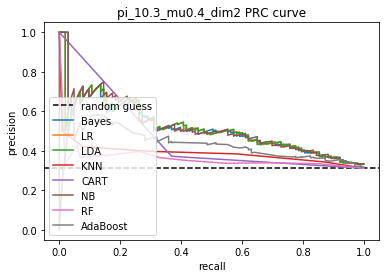

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.3 , mu = 0.4 , dim = 4  is 0.296 .
LR : AUROC = 0.707, AUPRC = 0.453, average precision = 0.359,  . 
Best threshold for ROC = 0.303, accuracy for the best ROC threshold is then 0.636, accuracy = 0.718. 
F1 score = 0.331, log loss = 9.734, recall = 0.235.
------------------------------------------------------------
LDA : AUROC = 0.707, AUPRC = 0.461, average precision = 0.366,  . 
Best threshold for ROC = 0.302, accuracy for the best ROC threshold is then 0.636, accuracy = 0.724. 
F1 score = 0.336, log loss = 9.524, recall = 0.235.
------------------------------------------------------------
K

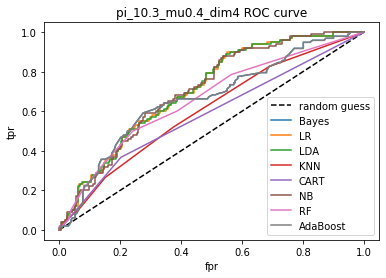

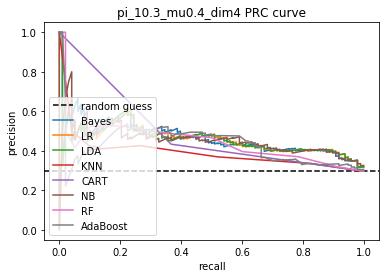

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.3 , mu = 0.4 , dim = 6  is 0.285 .
LR : AUROC = 0.714, AUPRC = 0.486, average precision = 0.347,  . 
Best threshold for ROC = 0.290, accuracy for the best ROC threshold is then 0.655, accuracy = 0.733. 
F1 score = 0.302, log loss = 9.210, recall = 0.202.
------------------------------------------------------------
LDA : AUROC = 0.713, AUPRC = 0.485, average precision = 0.347,  . 
Best threshold for ROC = 0.287, accuracy for the best ROC threshold is then 0.661, accuracy = 0.733. 
F1 score = 0.302, log loss = 9.210, recall = 0.202.
-------------------------------------------------------

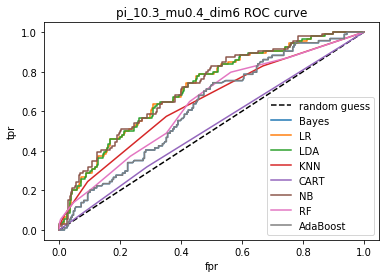

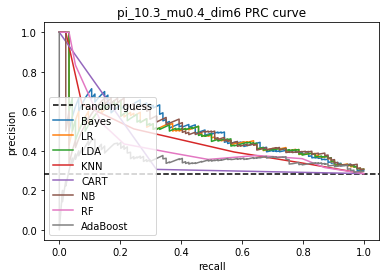

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  KNN
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.3 , mu = 0.4 , dim = 8  is 0.299 .
LR : AUROC = 0.755, AUPRC = 0.615, average precision = 0.417,  . 
Best threshold for ROC = 0.306, accuracy for the best ROC threshold is then 0.712, accuracy = 0.742. 
F1 score = 0.459, log loss = 8.896, recall = 0.364.
------------------------------------------------------------
LDA : AUROC = 0.754, AUPRC = 0.617, average precision = 0.429,  . 
Best threshold for ROC = 0.299, accuracy for the best ROC threshold is then 0.709, accuracy = 0.752. 
F1 score = 0.468, log loss = 8.582, recall = 0.364.
------------------------------------------------------------
KN

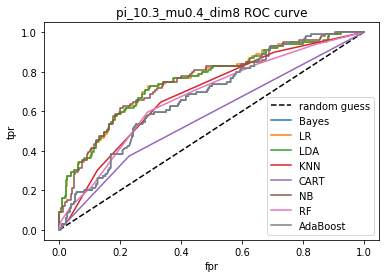

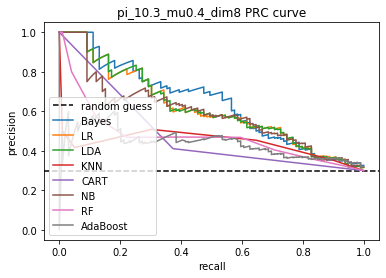

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.3 , mu = 0.4 , dim = 10  is 0.284 .
LR : AUROC = 0.705, AUPRC = 0.533, average precision = 0.361,  . 
Best threshold for ROC = 0.275, accuracy for the best ROC threshold is then 0.661, accuracy = 0.739. 
F1 score = 0.338, log loss = 9.001, recall = 0.234.
------------------------------------------------------------
LDA : AUROC = 0.704, AUPRC = 0.532, average precision = 0.370,  . 
Best threshold for ROC = 0.278, accuracy for the best ROC threshold is then 0.655, accuracy = 0.745. 
F1 score = 0.344, log loss = 8.792, recall = 0.234.
------------------------------------------------------------

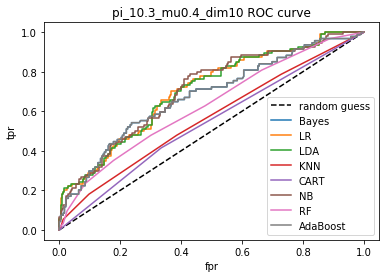

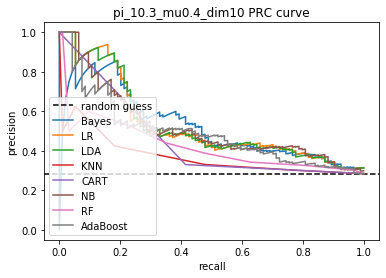

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  AdaBoost
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.3 , mu = 0.6 , dim = 2  is 0.306 .
LR : AUROC = 0.814, AUPRC = 0.718, average precision = 0.533,  . 
Best threshold for ROC = 0.327, accuracy for the best ROC threshold is then 0.718, accuracy = 0.797. 
F1 score = 0.621, log loss = 7.012, recall = 0.545.
------------------------------------------------------------
LDA : AUROC = 0.813, AUPRC = 0.718, average precision = 0.533,  . 
Best threshold for ROC = 0.332, accuracy for the best ROC threshold is then 0.724, accuracy = 0.797. 
F1 score = 0.621, log loss = 7.012, recall = 0.545.
------------------------------------------------------

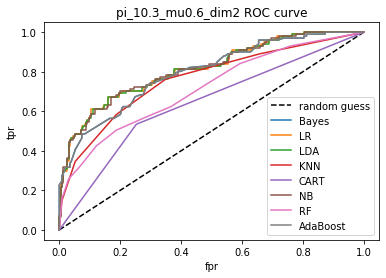

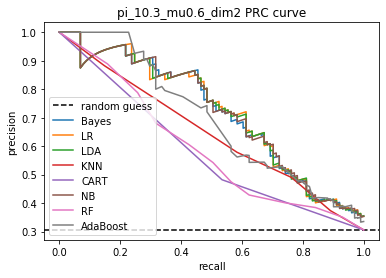

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  KNN
Positive ratio for pi_1 = 0.3 , mu = 0.6 , dim = 4  is 0.292 .
LR : AUROC = 0.822, AUPRC = 0.682, average precision = 0.462,  . 
Best threshold for ROC = 0.318, accuracy for the best ROC threshold is then 0.776, accuracy = 0.779. 
F1 score = 0.523, log loss = 7.640, recall = 0.417.
------------------------------------------------------------
LDA : AUROC = 0.822, AUPRC = 0.683, average precision = 0.462,  . 
Best threshold for ROC = 0.316, accuracy for the best ROC threshold is then 0.776, accuracy = 0.779. 
F1 score = 0.523, log loss = 7.640, recall = 0.417.
------------------------------------------------------------
KNN 

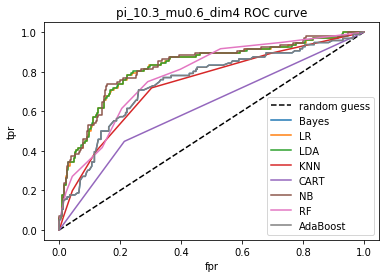

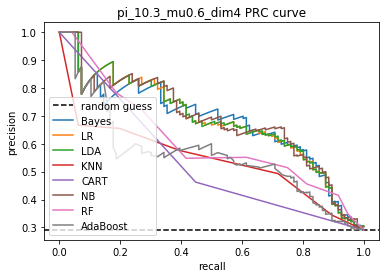

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  NB
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  AdaBoost
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  AdaBoost
Positive ratio for pi_1 = 0.3 , mu = 0.6 , dim = 6  is 0.308 .
LR : AUROC = 0.770, AUPRC = 0.576, average precision = 0.460,  . 
Best threshold for ROC = 0.301, accuracy for the best ROC threshold is then 0.706, accuracy = 0.755. 
F1 score = 0.526, log loss = 8.478, recall = 0.441.
------------------------------------------------------------
LDA : AUROC = 0.771, AUPRC = 0.575, average precision = 0.462,  . 
Best threshold for ROC = 0.303, accuracy for the best ROC threshold is then 0.709, accuracy = 0.755. 
F1 score = 0.532, log loss = 8.478, recall = 0.451.
-------------------------------------------------------

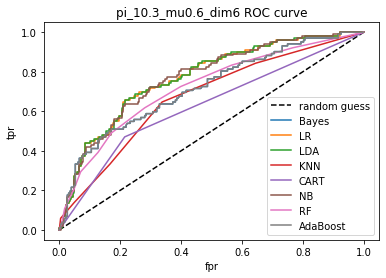

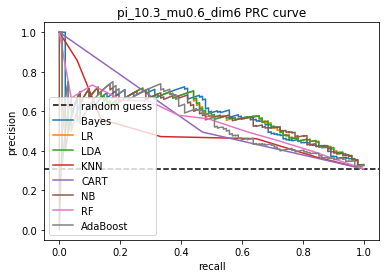

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  RF
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  AdaBoost
Positive ratio for pi_1 = 0.3 , mu = 0.6 , dim = 8  is 0.304 .
LR : AUROC = 0.829, AUPRC = 0.677, average precision = 0.477,  . 
Best threshold for ROC = 0.324, accuracy for the best ROC threshold is then 0.745, accuracy = 0.773. 
F1 score = 0.540, log loss = 7.850, recall = 0.440.
------------------------------------------------------------
LDA : AUROC = 0.829, AUPRC = 0.676, average precision = 0.477,  . 
Best threshold for ROC = 0.321, accuracy for the best ROC threshold is then 0.742, accuracy = 0.773. 
F1 score = 0.540, log loss = 7.850, recall = 0.440.
----------------------------------------------------------

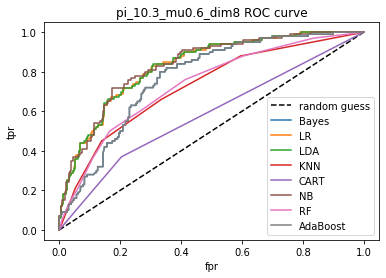

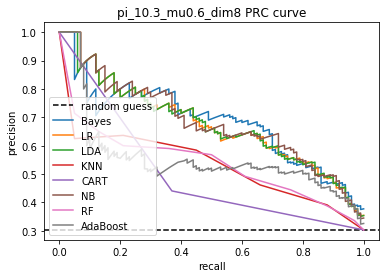

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  NB
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  KNN
Positive ratio for pi_1 = 0.3 , mu = 0.6 , dim = 10  is 0.279 .
LR : AUROC = 0.831, AUPRC = 0.689, average precision = 0.483,  . 
Best threshold for ROC = 0.256, accuracy for the best ROC threshold is then 0.733, accuracy = 0.800. 
F1 score = 0.566, log loss = 6.908, recall = 0.467.
------------------------------------------------------------
LDA : AUROC = 0.832, AUPRC = 0.692, average precision = 0.483,  . 
Best threshold for ROC = 0.263, accuracy for the best ROC threshold is then 0.733, accuracy = 0.800. 
F1 score = 0.566, log loss = 6.908, recall = 0.467.
------------------------------------------------------------
KNN 

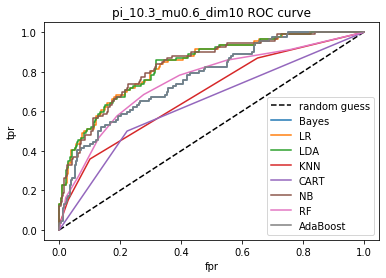

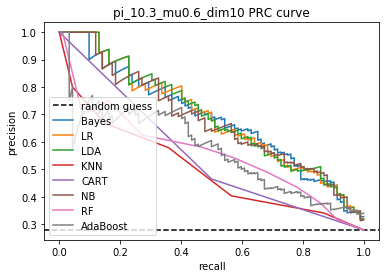

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.3 , mu = 0.8 , dim = 2  is 0.32 .
LR : AUROC = 0.879, AUPRC = 0.761, average precision = 0.574,  . 
Best threshold for ROC = 0.341, accuracy for the best ROC threshold is then 0.815, accuracy = 0.803. 
F1 score = 0.673, log loss = 6.803, recall = 0.632.
------------------------------------------------------------
LDA : AUROC = 0.879, AUPRC = 0.761, average precision = 0.574,  . 
Best threshold for ROC = 0.338, accuracy for the best ROC threshold is then 0.815, accuracy = 0.803. 
F1 score = 0.673, log loss = 6.803, recall = 0.632.
------------------------------------------------------------
KN

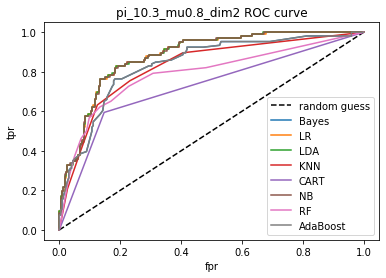

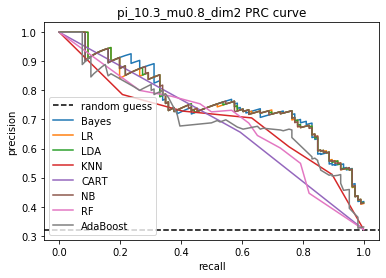

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  AdaBoost
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  AdaBoost
Positive ratio for pi_1 = 0.3 , mu = 0.8 , dim = 4  is 0.282 .
LR : AUROC = 0.931, AUPRC = 0.840, average precision = 0.624,  . 
Best threshold for ROC = 0.368, accuracy for the best ROC threshold is then 0.855, accuracy = 0.858. 
F1 score = 0.728, log loss = 4.919, recall = 0.677.
------------------------------------------------------------
LDA : AUROC = 0.931, AUPRC = 0.841, average precision = 0.632,  . 
Best threshold for ROC = 0.366, accuracy for the best ROC threshold is then 0.852, accuracy = 0.861. 
F1 score = 0.736, log loss = 4.815, recall = 0.688.
-----------------------------------------------------

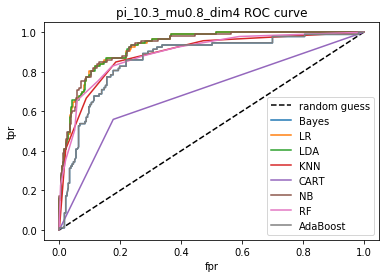

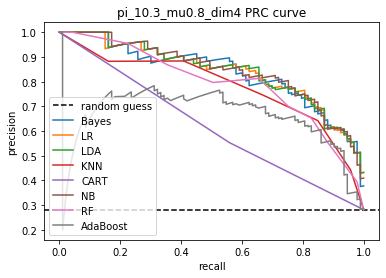

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  NB
Positive ratio for pi_1 = 0.3 , mu = 0.8 , dim = 6  is 0.289 .
LR : AUROC = 0.814, AUPRC = 0.706, average precision = 0.499,  . 
Best threshold for ROC = 0.261, accuracy for the best ROC threshold is then 0.745, accuracy = 0.797. 
F1 score = 0.589, log loss = 7.012, recall = 0.505.
------------------------------------------------------------
LDA : AUROC = 0.814, AUPRC = 0.706, average precision = 0.499,  . 
Best threshold for ROC = 0.241, accuracy for the best ROC threshold is then 0.730, accuracy = 0.797. 
F1 score = 0.589, log loss = 7.012, recall = 0.505.
------------------------------------------------------------
KNN :

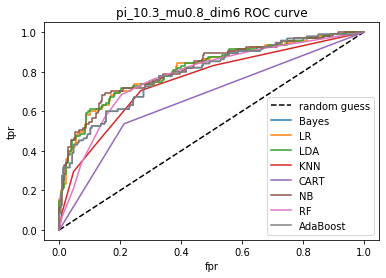

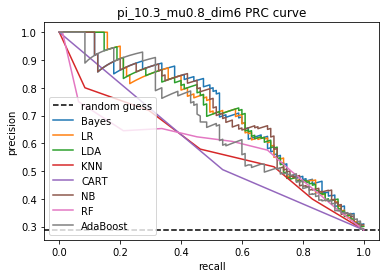

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  RF
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.3 , mu = 0.8 , dim = 8  is 0.291 .
LR : AUROC = 0.838, AUPRC = 0.694, average precision = 0.512,  . 
Best threshold for ROC = 0.244, accuracy for the best ROC threshold is then 0.745, accuracy = 0.797. 
F1 score = 0.617, log loss = 7.012, recall = 0.562.
------------------------------------------------------------
LDA : AUROC = 0.837, AUPRC = 0.696, average precision = 0.528,  . 
Best threshold for ROC = 0.232, accuracy for the best ROC threshold is then 0.739, accuracy = 0.806. 
F1 score = 0.632, log loss = 6.698, recall = 0.573.
------------------------------------------------------------
KNN 

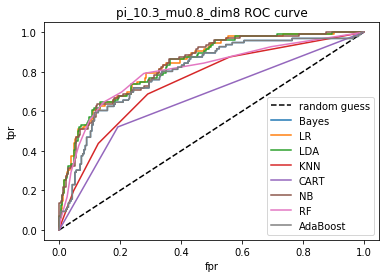

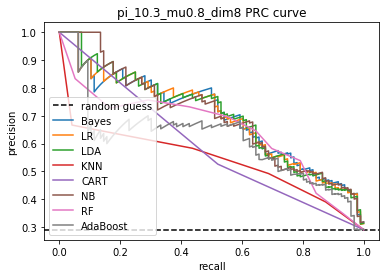

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  RF
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  AdaBoost
Positive ratio for pi_1 = 0.3 , mu = 0.8 , dim = 10  is 0.29 .
LR : AUROC = 0.874, AUPRC = 0.786, average precision = 0.581,  . 
Best threshold for ROC = 0.287, accuracy for the best ROC threshold is then 0.779, accuracy = 0.833. 
F1 score = 0.671, log loss = 5.756, recall = 0.583.
------------------------------------------------------------
LDA : AUROC = 0.874, AUPRC = 0.787, average precision = 0.575,  . 
Best threshold for ROC = 0.286, accuracy for the best ROC threshold is then 0.776, accuracy = 0.830. 
F1 score = 0.667, log loss = 5.861, recall = 0.583.
---------------------------------------------------------

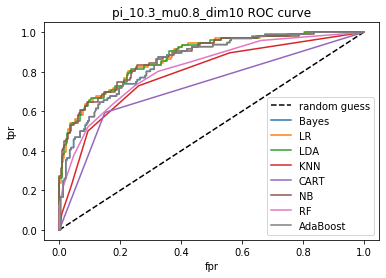

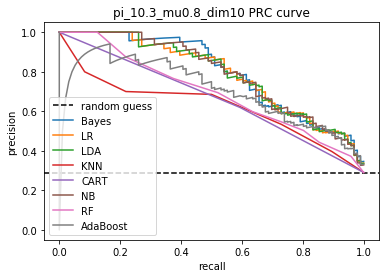

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.3 , mu = 1 , dim = 2  is 0.303 .
LR : AUROC = 0.915, AUPRC = 0.864, average precision = 0.681,  . 
Best threshold for ROC = 0.333, accuracy for the best ROC threshold is then 0.833, accuracy = 0.870. 
F1 score = 0.779, log loss = 4.501, recall = 0.760.
------------------------------------------------------------
LDA : AUROC = 0.915, AUPRC = 0.864, average precision = 0.681,  . 
Best threshold for ROC = 0.324, accuracy for the best ROC threshold is then 0.833, accuracy = 0.870. 
F1 score = 0.779, log loss = 4.501, recall = 0.760.
------------------------------------------------------------
KNN :

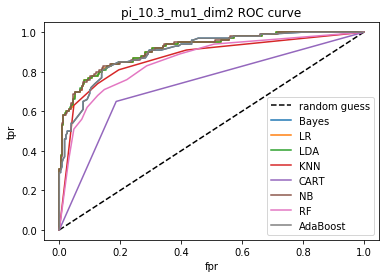

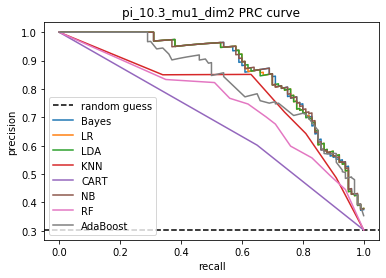

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  AdaBoost
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.3 , mu = 1 , dim = 4  is 0.319 .
LR : AUROC = 0.922, AUPRC = 0.856, average precision = 0.673,  . 
Best threshold for ROC = 0.305, accuracy for the best ROC threshold is then 0.861, accuracy = 0.858. 
F1 score = 0.761, log loss = 4.919, recall = 0.714.
------------------------------------------------------------
LDA : AUROC = 0.921, AUPRC = 0.855, average precision = 0.667,  . 
Best threshold for ROC = 0.293, accuracy for the best ROC threshold is then 0.852, accuracy = 0.855. 
F1 score = 0.755, log loss = 5.024, recall = 0.705.
------------------------------------------------------------
KN

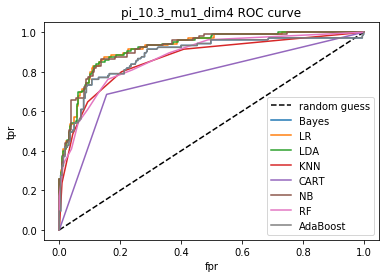

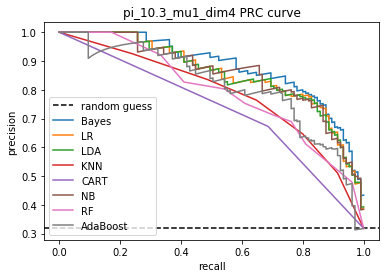

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  AdaBoost
Positive ratio for pi_1 = 0.3 , mu = 1 , dim = 6  is 0.306 .
LR : AUROC = 0.923, AUPRC = 0.856, average precision = 0.671,  . 
Best threshold for ROC = 0.271, accuracy for the best ROC threshold is then 0.842, accuracy = 0.864. 
F1 score = 0.757, log loss = 4.710, recall = 0.693.
------------------------------------------------------------
LDA : AUROC = 0.926, AUPRC = 0.858, average precision = 0.665,  . 
Best threshold for ROC = 0.279, accuracy for the best ROC threshold is then 0.858, accuracy = 0.861. 
F1 score = 0.750, log loss = 4.815, recall = 0.683.
------------------------------------------------------------
KN

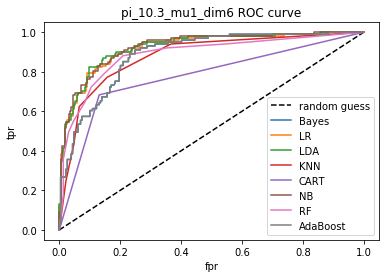

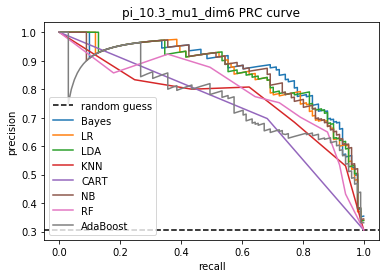

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  LDA
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.3 , mu = 1 , dim = 8  is 0.319 .
LR : AUROC = 0.883, AUPRC = 0.801, average precision = 0.613,  . 
Best threshold for ROC = 0.329, accuracy for the best ROC threshold is then 0.788, accuracy = 0.827. 
F1 score = 0.705, log loss = 5.966, recall = 0.648.
------------------------------------------------------------
LDA : AUROC = 0.884, AUPRC = 0.804, average precision = 0.619,  . 
Best threshold for ROC = 0.332, accuracy for the best ROC threshold is then 0.791, accuracy = 0.830. 
F1 score = 0.711, log loss = 5.861, recall = 0.657.
------------------------------------------------------------
KNN : A

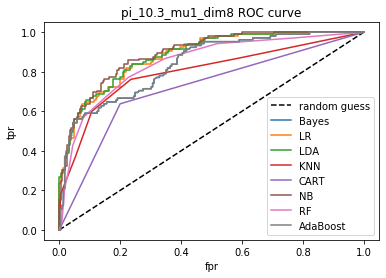

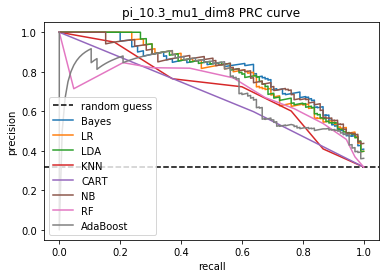

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  NB
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  LDA
Positive ratio for pi_1 = 0.3 , mu = 1 , dim = 10  is 0.299 .
LR : AUROC = 0.937, AUPRC = 0.878, average precision = 0.684,  . 
Best threshold for ROC = 0.324, accuracy for the best ROC threshold is then 0.855, accuracy = 0.873. 
F1 score = 0.772, log loss = 4.396, recall = 0.717.
------------------------------------------------------------
LDA : AUROC = 0.937, AUPRC = 0.877, average precision = 0.691,  . 
Best threshold for ROC = 0.322, accuracy for the best ROC threshold is then 0.848, accuracy = 0.876. 
F1 score = 0.778, log loss = 4.291, recall = 0.727.
------------------------------------------------------------
KN

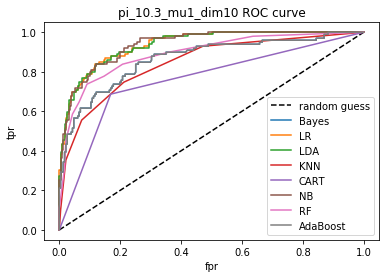

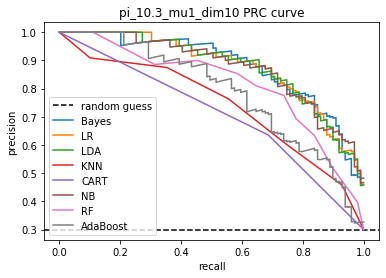

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  LDA
Positive ratio for pi_1 = 0.4 , mu = 0.2 , dim = 2  is 0.413 .
LR : AUROC = 0.622, AUPRC = 0.483, average precision = 0.428,  . 
Best threshold for ROC = 0.423, accuracy for the best ROC threshold is then 0.579, accuracy = 0.579. 
F1 score = 0.315, log loss = 14.548, recall = 0.235.
------------------------------------------------------------
LDA : AUROC = 0.622, AUPRC = 0.483, average precision = 0.428,  . 
Best threshold for ROC = 0.422, accuracy for the best ROC threshold is then 0.579, accuracy = 0.579. 
F1 score = 0.315, log loss = 14.548, recall = 0.235.
------------------------------------------------------------

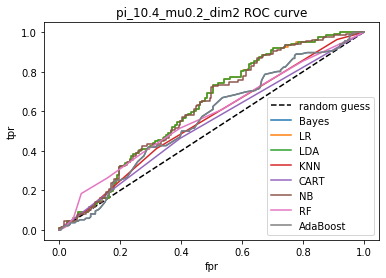

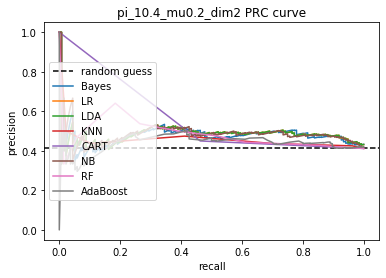

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  RF
The best model measured by  average_precision is  RF
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  RF
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.4 , mu = 0.2 , dim = 4  is 0.411 .
LR : AUROC = 0.584, AUPRC = 0.485, average precision = 0.416,  . 
Best threshold for ROC = 0.417, accuracy for the best ROC threshold is then 0.564, accuracy = 0.573. 
F1 score = 0.203, log loss = 14.758, recall = 0.132.
------------------------------------------------------------
LDA : AUROC = 0.584, AUPRC = 0.485, average precision = 0.416,  . 
Best threshold for ROC = 0.416, accuracy for the best ROC threshold is then 0.564, accuracy = 0.573. 
F1 score = 0.203, log loss = 14.758, recall = 0.132.
---------------------------------------------------------

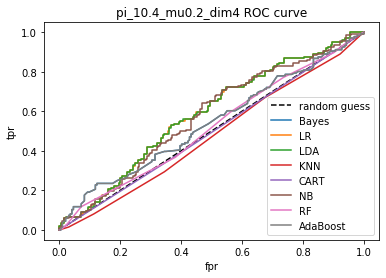

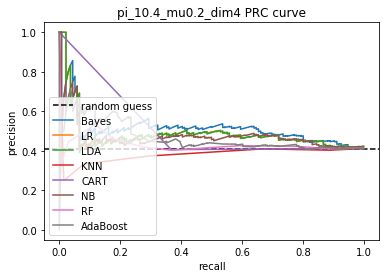

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  AdaBoost
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.4 , mu = 0.2 , dim = 6  is 0.401 .
LR : AUROC = 0.589, AUPRC = 0.473, average precision = 0.410,  . 
Best threshold for ROC = 0.396, accuracy for the best ROC threshold is then 0.561, accuracy = 0.582. 
F1 score = 0.274, log loss = 14.444, recall = 0.197.
------------------------------------------------------------
LDA : AUROC = 0.589, AUPRC = 0.473, average precision = 0.410,  . 
Best threshold for ROC = 0.396, accuracy for the best ROC threshold is then 0.561, accuracy = 0.582. 
F1 score = 0.274, log loss = 14.444, recall = 0.197.
-----------------------------------------------

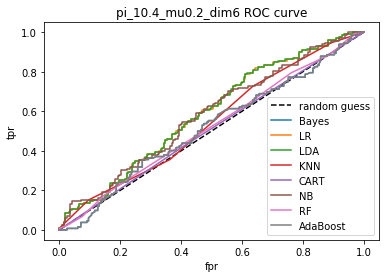

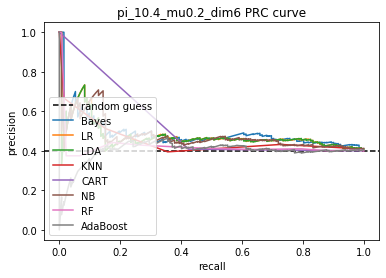

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.4 , mu = 0.2 , dim = 8  is 0.415 .
LR : AUROC = 0.607, AUPRC = 0.475, average precision = 0.430,  . 
Best threshold for ROC = 0.409, accuracy for the best ROC threshold is then 0.603, accuracy = 0.579. 
F1 score = 0.294, log loss = 14.548, recall = 0.212.
------------------------------------------------------------
LDA : AUROC = 0.607, AUPRC = 0.475, average precision = 0.428,  . 
Best threshold for ROC = 0.407, accuracy for the best ROC threshold is then 0.600, accuracy = 0.576. 
F1 score = 0.293, log loss = 14.653, recall = 0.212.
----------------------------------------------------

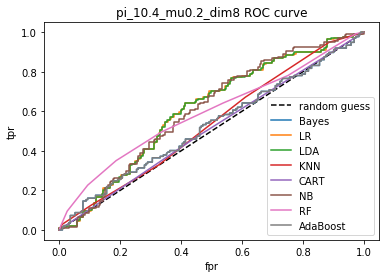

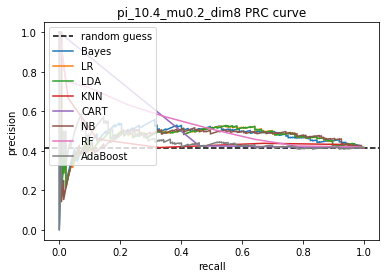

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  RF
The best model measured by  accuracy is  RF
The best model measured by  average_precision is  RF
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  RF
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.4 , mu = 0.2 , dim = 10  is 0.387 .
LR : AUROC = 0.576, AUPRC = 0.449, average precision = 0.407,  . 
Best threshold for ROC = 0.356, accuracy for the best ROC threshold is then 0.533, accuracy = 0.618. 
F1 score = 0.212, log loss = 13.188, recall = 0.133.
------------------------------------------------------------
LDA : AUROC = 0.576, AUPRC = 0.450, average precision = 0.412,  . 
Best threshold for ROC = 0.355, accuracy for the best ROC threshold is then 0.536, accuracy = 0.624. 
F1 score = 0.225, log loss = 12.978, recall = 0.141.
----------------------------------------------------------

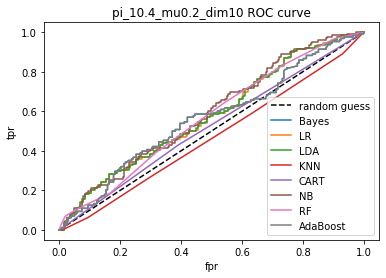

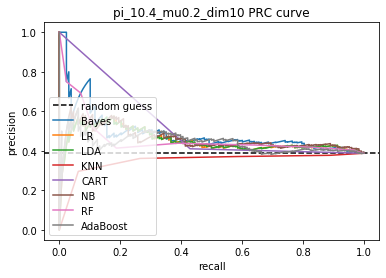

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  NB
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.4 , mu = 0.4 , dim = 2  is 0.377 .
LR : AUROC = 0.706, AUPRC = 0.596, average precision = 0.488,  . 
Best threshold for ROC = 0.353, accuracy for the best ROC threshold is then 0.658, accuracy = 0.691. 
F1 score = 0.528, log loss = 10.676, recall = 0.460.
------------------------------------------------------------
LDA : AUROC = 0.706, AUPRC = 0.596, average precision = 0.488,  . 
Best threshold for ROC = 0.352, accuracy for the best ROC threshold is then 0.658, accuracy = 0.691. 
F1 score = 0.528, log loss = 10.676, recall = 0.460.
-------------------------------------------------------

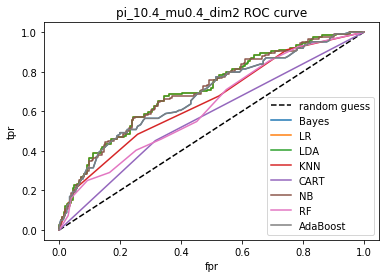

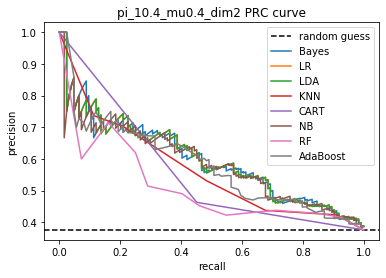

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  KNN
Positive ratio for pi_1 = 0.4 , mu = 0.4 , dim = 4  is 0.413 .
LR : AUROC = 0.665, AUPRC = 0.556, average precision = 0.471,  . 
Best threshold for ROC = 0.413, accuracy for the best ROC threshold is then 0.630, accuracy = 0.621. 
F1 score = 0.473, log loss = 13.083, recall = 0.412.
------------------------------------------------------------
LDA : AUROC = 0.664, AUPRC = 0.556, average precision = 0.473,  . 
Best threshold for ROC = 0.414, accuracy for the best ROC threshold is then 0.636, accuracy = 0.624. 
F1 score = 0.475, log loss = 12.978, recall = 0.412.
------------------------------------------------------------
KNN

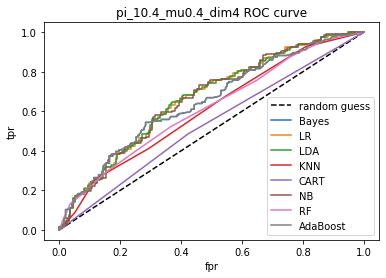

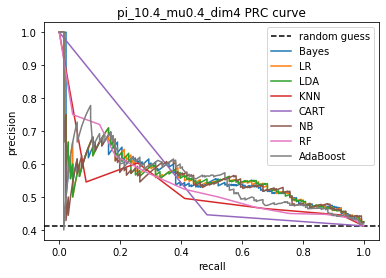

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  LDA
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  AdaBoost
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.4 , mu = 0.4 , dim = 6  is 0.411 .
LR : AUROC = 0.727, AUPRC = 0.635, average precision = 0.525,  . 
Best threshold for ROC = 0.415, accuracy for the best ROC threshold is then 0.682, accuracy = 0.679. 
F1 score = 0.539, log loss = 11.094, recall = 0.456.
------------------------------------------------------------
LDA : AUROC = 0.726, AUPRC = 0.632, average precision = 0.532,  . 
Best threshold for ROC = 0.409, accuracy for the best ROC threshold is then 0.682, accuracy = 0.685. 
F1 score = 0.552, log loss = 10.885, recall = 0.471.
------------------------------------------------

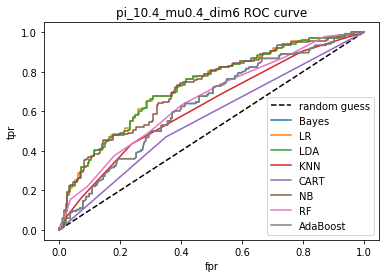

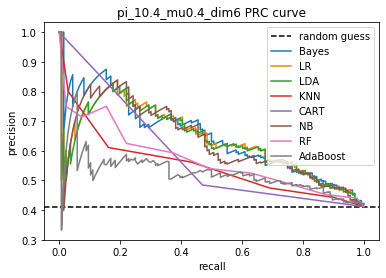

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  LDA
Positive ratio for pi_1 = 0.4 , mu = 0.4 , dim = 8  is 0.426 .
LR : AUROC = 0.687, AUPRC = 0.616, average precision = 0.509,  . 
Best threshold for ROC = 0.431, accuracy for the best ROC threshold is then 0.606, accuracy = 0.639. 
F1 score = 0.533, log loss = 12.455, recall = 0.482.
------------------------------------------------------------
LDA : AUROC = 0.686, AUPRC = 0.615, average precision = 0.512,  . 
Best threshold for ROC = 0.433, accuracy for the best ROC threshold is then 0.612, accuracy = 0.642. 
F1 score = 0.539, log loss = 12.350, recall = 0.489.
------------------------------------------------------------

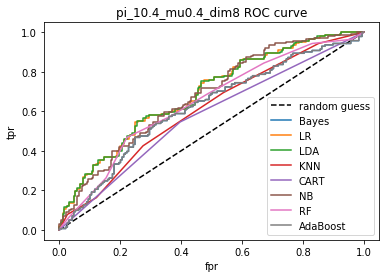

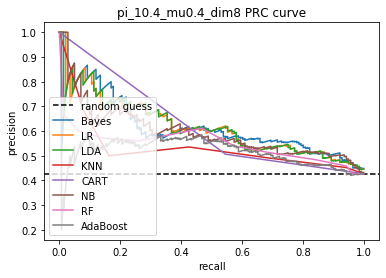

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  RF
The best model measured by  accuracy is  RF
The best model measured by  average_precision is  RF
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  RF
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.4 , mu = 0.4 , dim = 10  is 0.393 .
LR : AUROC = 0.712, AUPRC = 0.638, average precision = 0.508,  . 
Best threshold for ROC = 0.389, accuracy for the best ROC threshold is then 0.627, accuracy = 0.688. 
F1 score = 0.516, log loss = 10.780, recall = 0.423.
------------------------------------------------------------
LDA : AUROC = 0.711, AUPRC = 0.638, average precision = 0.508,  . 
Best threshold for ROC = 0.392, accuracy for the best ROC threshold is then 0.630, accuracy = 0.688. 
F1 score = 0.516, log loss = 10.780, recall = 0.423.
-----------------------------------------------------------

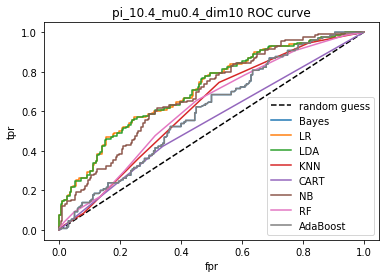

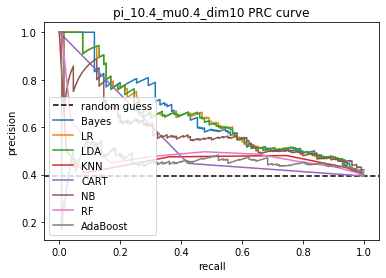

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  NB
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.4 , mu = 0.6 , dim = 2  is 0.399 .
LR : AUROC = 0.824, AUPRC = 0.764, average precision = 0.643,  . 
Best threshold for ROC = 0.437, accuracy for the best ROC threshold is then 0.764, accuracy = 0.785. 
F1 score = 0.722, log loss = 7.431, recall = 0.697.
------------------------------------------------------------
LDA : AUROC = 0.824, AUPRC = 0.764, average precision = 0.643,  . 
Best threshold for ROC = 0.433, accuracy for the best ROC threshold is then 0.764, accuracy = 0.785. 
F1 score = 0.719, log loss = 7.431, recall = 0.689.
------------------------------------------------------------
KNN : 

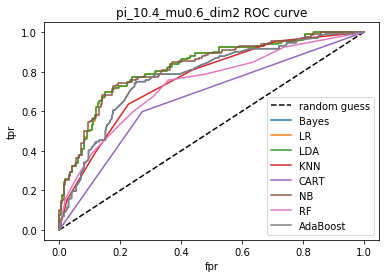

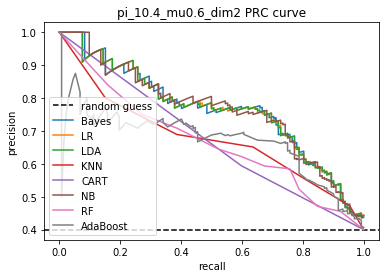

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.4 , mu = 0.6 , dim = 4  is 0.403 .
LR : AUROC = 0.797, AUPRC = 0.703, average precision = 0.556,  . 
Best threshold for ROC = 0.389, accuracy for the best ROC threshold is then 0.727, accuracy = 0.715. 
F1 score = 0.595, log loss = 9.838, recall = 0.519.
------------------------------------------------------------
LDA : AUROC = 0.797, AUPRC = 0.703, average precision = 0.556,  . 
Best threshold for ROC = 0.390, accuracy for the best ROC threshold is then 0.727, accuracy = 0.715. 
F1 score = 0.595, log loss = 9.838, recall = 0.519.
------------------------------------------------------------
KNN 

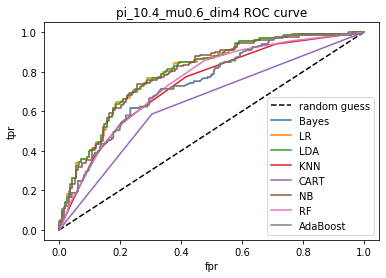

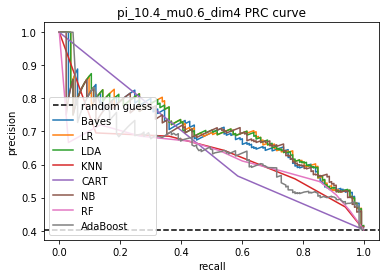

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  NB
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  AdaBoost
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  AdaBoost
Positive ratio for pi_1 = 0.4 , mu = 0.6 , dim = 6  is 0.411 .
LR : AUROC = 0.786, AUPRC = 0.712, average precision = 0.557,  . 
Best threshold for ROC = 0.440, accuracy for the best ROC threshold is then 0.718, accuracy = 0.703. 
F1 score = 0.637, log loss = 10.257, recall = 0.632.
------------------------------------------------------------
LDA : AUROC = 0.786, AUPRC = 0.712, average precision = 0.557,  . 
Best threshold for ROC = 0.442, accuracy for the best ROC threshold is then 0.718, accuracy = 0.703. 
F1 score = 0.637, log loss = 10.257, recall = 0.632.
----------------------------------------------------

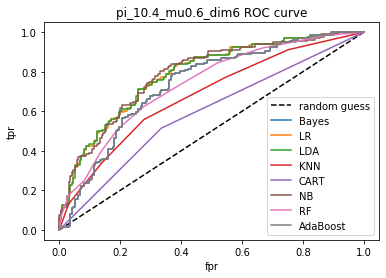

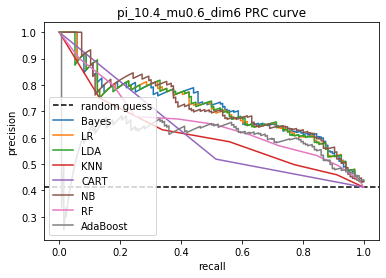

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.4 , mu = 0.6 , dim = 8  is 0.381 .
LR : AUROC = 0.844, AUPRC = 0.780, average precision = 0.582,  . 
Best threshold for ROC = 0.406, accuracy for the best ROC threshold is then 0.748, accuracy = 0.755. 
F1 score = 0.669, log loss = 8.478, recall = 0.651.
------------------------------------------------------------
LDA : AUROC = 0.844, AUPRC = 0.776, average precision = 0.578,  . 
Best threshold for ROC = 0.414, accuracy for the best ROC threshold is then 0.742, accuracy = 0.752. 
F1 score = 0.667, log loss = 8.582, recall = 0.651.
------------------------------------------------------------
KNN : 

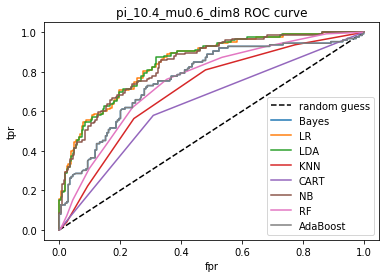

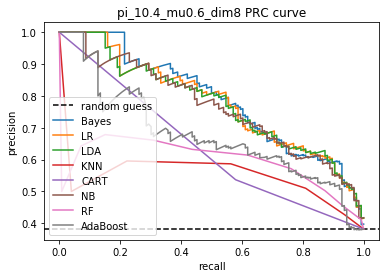

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  NB
Positive ratio for pi_1 = 0.4 , mu = 0.6 , dim = 10  is 0.417 .
LR : AUROC = 0.821, AUPRC = 0.764, average precision = 0.619,  . 
Best threshold for ROC = 0.411, accuracy for the best ROC threshold is then 0.742, accuracy = 0.752. 
F1 score = 0.687, log loss = 8.582, recall = 0.652.
------------------------------------------------------------
LDA : AUROC = 0.821, AUPRC = 0.763, average precision = 0.615,  . 
Best threshold for ROC = 0.418, accuracy for the best ROC threshold is then 0.730, accuracy = 0.748. 
F1 score = 0.684, log loss = 8.687, recall = 0.652.
------------------------------------------------------------
KNN :

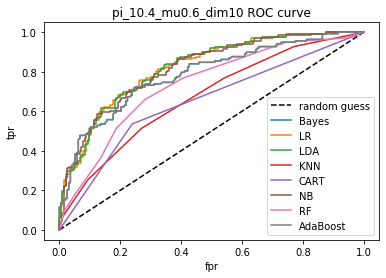

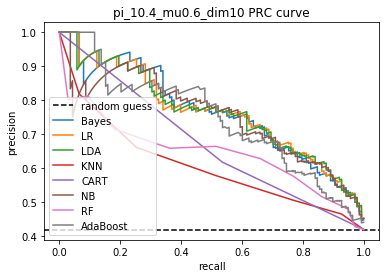

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.4 , mu = 0.8 , dim = 2  is 0.387 .
LR : AUROC = 0.877, AUPRC = 0.825, average precision = 0.647,  . 
Best threshold for ROC = 0.399, accuracy for the best ROC threshold is then 0.782, accuracy = 0.797. 
F1 score = 0.737, log loss = 7.012, recall = 0.734.
------------------------------------------------------------
LDA : AUROC = 0.877, AUPRC = 0.826, average precision = 0.647,  . 
Best threshold for ROC = 0.403, accuracy for the best ROC threshold is then 0.779, accuracy = 0.797. 
F1 score = 0.737, log loss = 7.012, recall = 0.734.
------------------------------------------------------------
KNN :

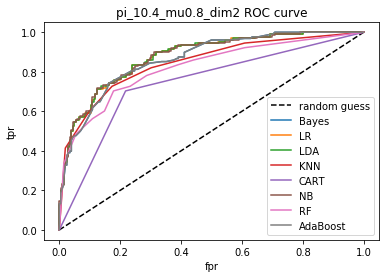

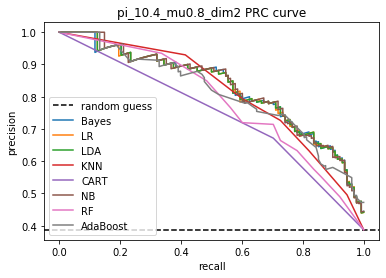

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  AdaBoost
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.4 , mu = 0.8 , dim = 4  is 0.397 .
LR : AUROC = 0.878, AUPRC = 0.836, average precision = 0.664,  . 
Best threshold for ROC = 0.434, accuracy for the best ROC threshold is then 0.794, accuracy = 0.803. 
F1 score = 0.749, log loss = 6.803, recall = 0.740.
------------------------------------------------------------
LDA : AUROC = 0.878, AUPRC = 0.836, average precision = 0.652,  . 
Best threshold for ROC = 0.426, accuracy for the best ROC threshold is then 0.788, accuracy = 0.794. 
F1 score = 0.736, log loss = 7.117, recall = 0.725.
------------------------------------------------------------

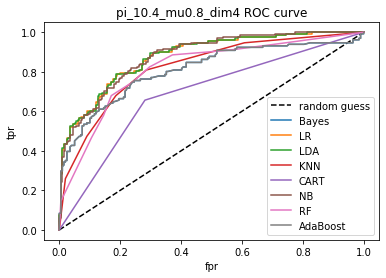

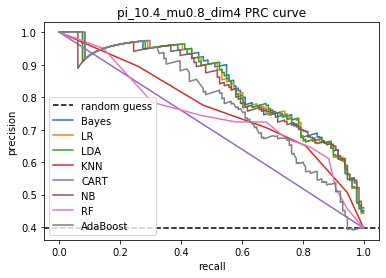

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.4 , mu = 0.8 , dim = 6  is 0.42 .
LR : AUROC = 0.880, AUPRC = 0.850, average precision = 0.697,  . 
Best threshold for ROC = 0.485, accuracy for the best ROC threshold is then 0.809, accuracy = 0.812. 
F1 score = 0.780, log loss = 6.489, recall = 0.791.
------------------------------------------------------------
LDA : AUROC = 0.880, AUPRC = 0.849, average precision = 0.701,  . 
Best threshold for ROC = 0.482, accuracy for the best ROC threshold is then 0.803, accuracy = 0.815. 
F1 score = 0.783, log loss = 6.385, recall = 0.791.
------------------------------------------------------------
KNN :

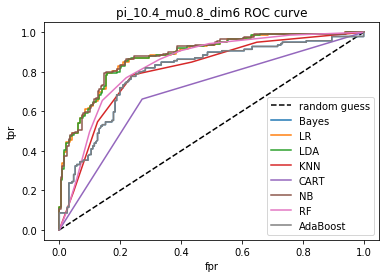

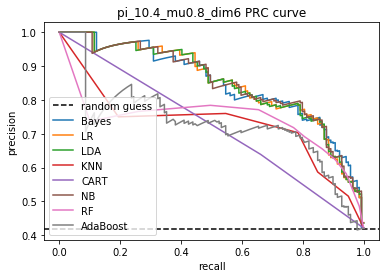

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  NB
Positive ratio for pi_1 = 0.4 , mu = 0.8 , dim = 8  is 0.393 .
LR : AUROC = 0.870, AUPRC = 0.794, average precision = 0.667,  . 
Best threshold for ROC = 0.400, accuracy for the best ROC threshold is then 0.812, accuracy = 0.806. 
F1 score = 0.740, log loss = 6.698, recall = 0.700.
------------------------------------------------------------
LDA : AUROC = 0.871, AUPRC = 0.791, average precision = 0.667,  . 
Best threshold for ROC = 0.403, accuracy for the best ROC threshold is then 0.812, accuracy = 0.806. 
F1 score = 0.740, log loss = 6.698, recall = 0.700.
------------------------------------------------------------
KNN

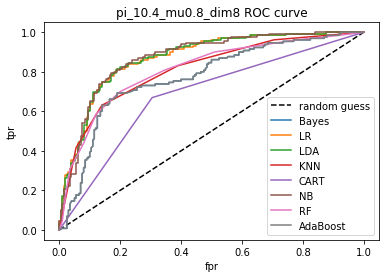

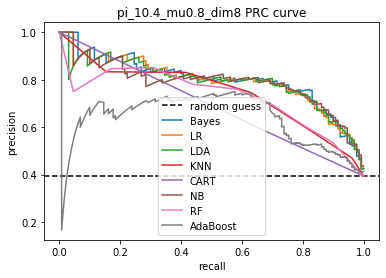

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.4 , mu = 0.8 , dim = 10  is 0.399 .
LR : AUROC = 0.895, AUPRC = 0.836, average precision = 0.668,  . 
Best threshold for ROC = 0.384, accuracy for the best ROC threshold is then 0.803, accuracy = 0.803. 
F1 score = 0.747, log loss = 6.803, recall = 0.727.
------------------------------------------------------------
LDA : AUROC = 0.895, AUPRC = 0.839, average precision = 0.672,  . 
Best threshold for ROC = 0.407, accuracy for the best ROC threshold is then 0.806, accuracy = 0.806. 
F1 score = 0.752, log loss = 6.698, recall = 0.735.
------------------------------------------------------------
KNN :

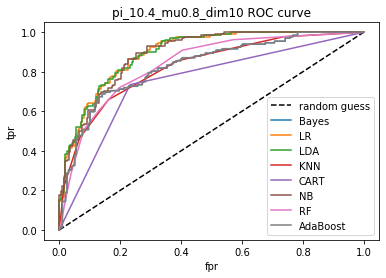

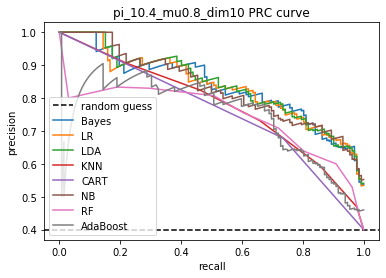

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  LDA
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  LDA
Positive ratio for pi_1 = 0.4 , mu = 1 , dim = 2  is 0.405 .
LR : AUROC = 0.923, AUPRC = 0.899, average precision = 0.705,  . 
Best threshold for ROC = 0.469, accuracy for the best ROC threshold is then 0.833, accuracy = 0.827. 
F1 score = 0.793, log loss = 5.966, recall = 0.813.
------------------------------------------------------------
LDA : AUROC = 0.923, AUPRC = 0.899, average precision = 0.714,  . 
Best threshold for ROC = 0.453, accuracy for the best ROC threshold is then 0.833, accuracy = 0.833. 
F1 score = 0.799, log loss = 5.757, recall = 0.813.
------------------------------------------------------------


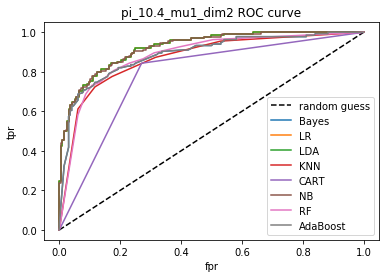

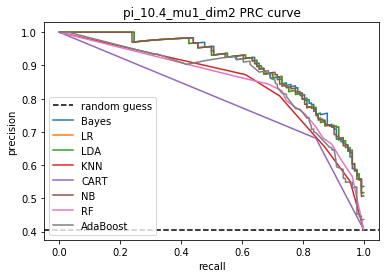

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.4 , mu = 1 , dim = 4  is 0.386 .
LR : AUROC = 0.911, AUPRC = 0.877, average precision = 0.697,  . 
Best threshold for ROC = 0.327, accuracy for the best ROC threshold is then 0.833, accuracy = 0.830. 
F1 score = 0.765, log loss = 5.861, recall = 0.717.
------------------------------------------------------------
LDA : AUROC = 0.911, AUPRC = 0.877, average precision = 0.697,  . 
Best threshold for ROC = 0.305, accuracy for the best ROC threshold is then 0.830, accuracy = 0.830. 
F1 score = 0.765, log loss = 5.861, recall = 0.717.
------------------------------------------------------------
KN

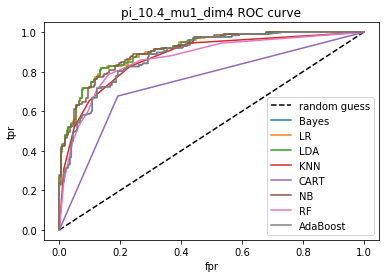

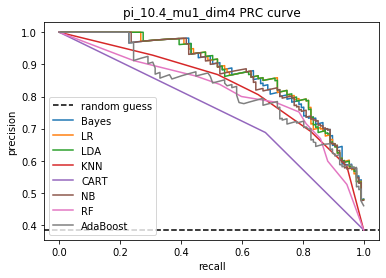

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  NB
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  AdaBoost
Positive ratio for pi_1 = 0.4 , mu = 1 , dim = 6  is 0.409 .
LR : AUROC = 0.918, AUPRC = 0.894, average precision = 0.730,  . 
Best threshold for ROC = 0.337, accuracy for the best ROC threshold is then 0.836, accuracy = 0.833. 
F1 score = 0.774, log loss = 5.756, recall = 0.696.
------------------------------------------------------------
LDA : AUROC = 0.919, AUPRC = 0.894, average precision = 0.743,  . 
Best threshold for ROC = 0.351, accuracy for the best ROC threshold is then 0.836, accuracy = 0.842. 
F1 score = 0.789, log loss = 5.443, recall = 0.719.
------------------------------------------------------------
K

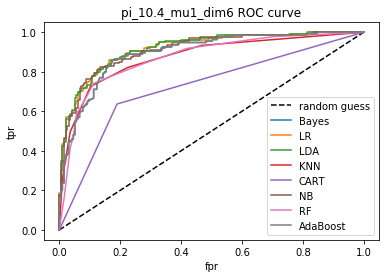

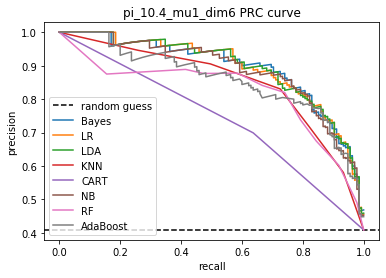

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  KNN
Positive ratio for pi_1 = 0.4 , mu = 1 , dim = 8  is 0.379 .
LR : AUROC = 0.912, AUPRC = 0.881, average precision = 0.699,  . 
Best threshold for ROC = 0.331, accuracy for the best ROC threshold is then 0.824, accuracy = 0.836. 
F1 score = 0.775, log loss = 5.652, recall = 0.744.
------------------------------------------------------------
LDA : AUROC = 0.910, AUPRC = 0.877, average precision = 0.689,  . 
Best threshold for ROC = 0.319, accuracy for the best ROC threshold is then 0.818, accuracy = 0.830. 
F1 score = 0.767, log loss = 5.861, recall = 0.736.
------------------------------------------------------------
KN

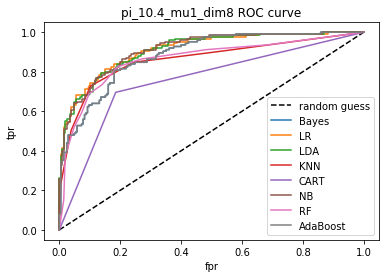

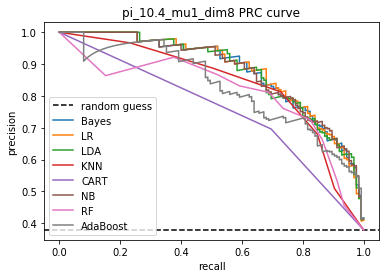

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.4 , mu = 1 , dim = 10  is 0.423 .
LR : AUROC = 0.933, AUPRC = 0.913, average precision = 0.761,  . 
Best threshold for ROC = 0.431, accuracy for the best ROC threshold is then 0.864, accuracy = 0.855. 
F1 score = 0.826, log loss = 5.024, recall = 0.814.
------------------------------------------------------------
LDA : AUROC = 0.931, AUPRC = 0.910, average precision = 0.756,  . 
Best threshold for ROC = 0.417, accuracy for the best ROC threshold is then 0.861, accuracy = 0.852. 
F1 score = 0.823, log loss = 5.129, recall = 0.814.
------------------------------------------------------------
KNN : 

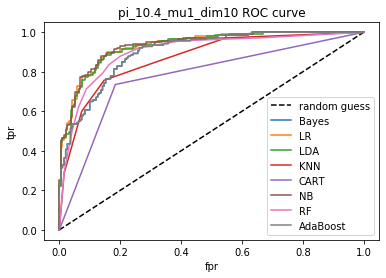

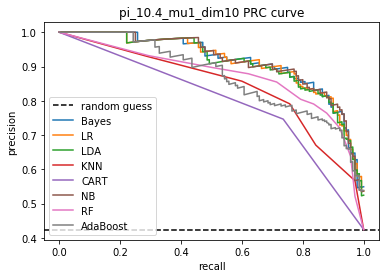

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.5 , mu = 0.2 , dim = 2  is 0.483 .
LR : AUROC = 0.677, AUPRC = 0.628, average precision = 0.551,  . 
Best threshold for ROC = 0.468, accuracy for the best ROC threshold is then 0.621, accuracy = 0.612. 
F1 score = 0.556, log loss = 13.397, recall = 0.503.
------------------------------------------------------------
LDA : AUROC = 0.677, AUPRC = 0.628, average precision = 0.551,  . 
Best threshold for ROC = 0.468, accuracy for the best ROC threshold is then 0.621, accuracy = 0.612. 
F1 score = 0.556, log loss = 13.397, recall = 0.503.
------------------------------------------------------------
KNN 

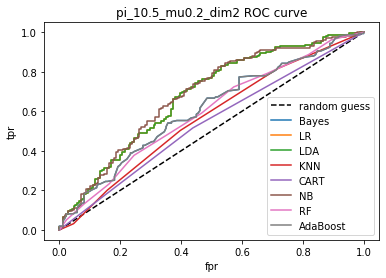

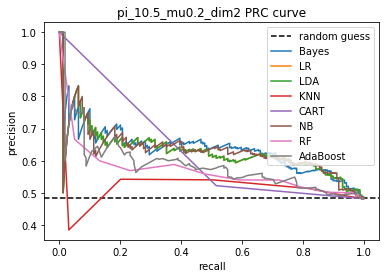

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  NB
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.5 , mu = 0.2 , dim = 4  is 0.509 .
LR : AUROC = 0.607, AUPRC = 0.583, average precision = 0.554,  . 
Best threshold for ROC = 0.526, accuracy for the best ROC threshold is then 0.600, accuracy = 0.582. 
F1 score = 0.621, log loss = 14.444, recall = 0.673.
------------------------------------------------------------
LDA : AUROC = 0.607, AUPRC = 0.583, average precision = 0.554,  . 
Best threshold for ROC = 0.526, accuracy for the best ROC threshold is then 0.600, accuracy = 0.582. 
F1 score = 0.621, log loss = 14.444, recall = 0.673.
------------------------------------------------------------


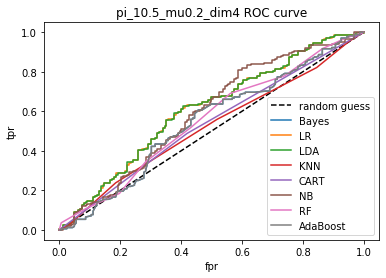

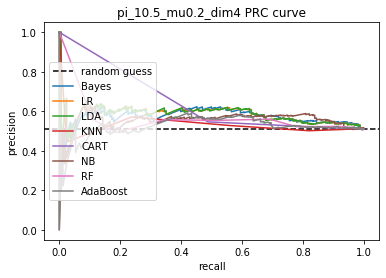

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.5 , mu = 0.2 , dim = 6  is 0.486 .
LR : AUROC = 0.631, AUPRC = 0.625, average precision = 0.554,  . 
Best threshold for ROC = 0.475, accuracy for the best ROC threshold is then 0.582, accuracy = 0.612. 
F1 score = 0.573, log loss = 13.397, recall = 0.537.
------------------------------------------------------------
LDA : AUROC = 0.631, AUPRC = 0.625, average precision = 0.554,  . 
Best threshold for ROC = 0.475, accuracy for the best ROC threshold is then 0.582, accuracy = 0.612. 
F1 score = 0.573, log loss = 13.397, recall = 0.537.
------------------------------------------------------------
KN

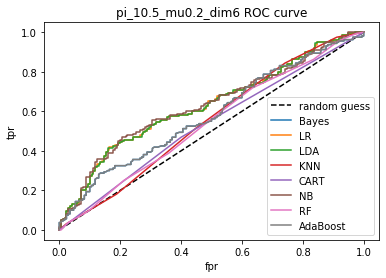

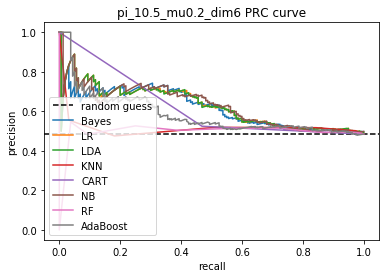

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  NB
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  NB
Positive ratio for pi_1 = 0.5 , mu = 0.2 , dim = 8  is 0.495 .
LR : AUROC = 0.569, AUPRC = 0.573, average precision = 0.534,  . 
Best threshold for ROC = 0.496, accuracy for the best ROC threshold is then 0.561, accuracy = 0.570. 
F1 score = 0.562, log loss = 14.862, recall = 0.558.
------------------------------------------------------------
LDA : AUROC = 0.570, AUPRC = 0.574, average precision = 0.534,  . 
Best threshold for ROC = 0.496, accuracy for the best ROC threshold is then 0.561, accuracy = 0.570. 
F1 score = 0.562, log loss = 14.862, recall = 0.558.
------------------------------------------------------------
KNN 

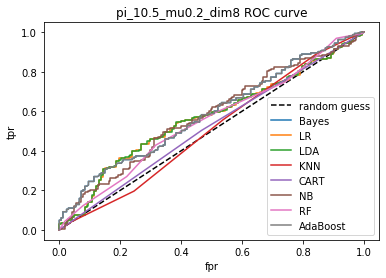

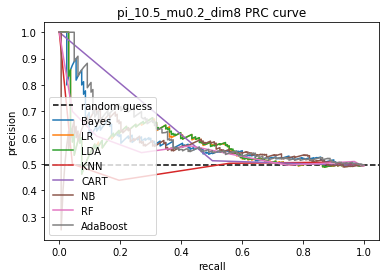

The best model measured by  AUROC is  AdaBoost
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.5 , mu = 0.2 , dim = 10  is 0.499 .
LR : AUROC = 0.554, AUPRC = 0.568, average precision = 0.506,  . 
Best threshold for ROC = 0.512, accuracy for the best ROC threshold is then 0.506, accuracy = 0.512. 
F1 score = 0.525, log loss = 16.851, recall = 0.539.
------------------------------------------------------------
LDA : AUROC = 0.554, AUPRC = 0.568, average precision = 0.505,  . 
Best threshold for ROC = 0.511, accuracy for the best ROC threshold is then 0.506, accuracy = 0.509. 
F1 score = 0.521, log loss = 16.956, recall = 0.533.
--------------------------------------------------------

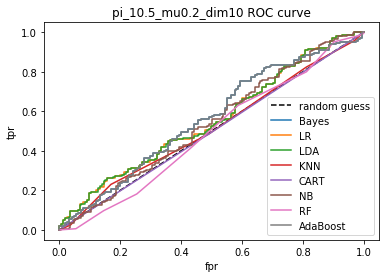

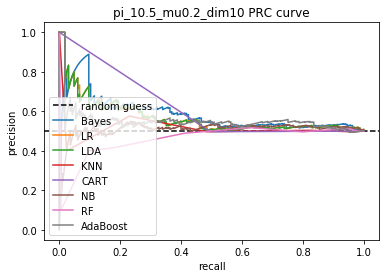

The best model measured by  AUROC is  AdaBoost
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  AdaBoost
The best model measured by  accuracy is  AdaBoost
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  AdaBoost
The best model measured by  recall is  NB
Positive ratio for pi_1 = 0.5 , mu = 0.4 , dim = 2  is 0.493 .
LR : AUROC = 0.702, AUPRC = 0.696, average precision = 0.593,  . 
Best threshold for ROC = 0.479, accuracy for the best ROC threshold is then 0.648, accuracy = 0.648. 
F1 score = 0.623, log loss = 12.141, recall = 0.589.
------------------------------------------------------------
LDA : AUROC = 0.703, AUPRC = 0.696, average precision = 0.590,  . 
Best threshold for ROC = 0.476, accuracy for the best ROC threshold is then 0.645, accuracy = 0.645. 
F1 score = 0.621, log loss = 12.246, recall = 0.589.
---------------------------------

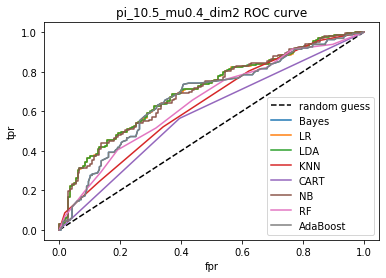

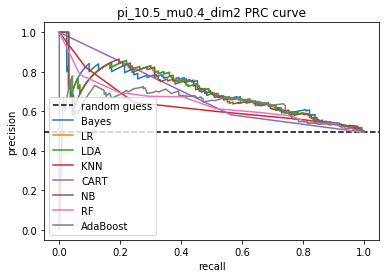

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  AdaBoost
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.5 , mu = 0.4 , dim = 4  is 0.494 .
LR : AUROC = 0.759, AUPRC = 0.729, average precision = 0.618,  . 
Best threshold for ROC = 0.503, accuracy for the best ROC threshold is then 0.682, accuracy = 0.682. 
F1 score = 0.681, log loss = 10.990, recall = 0.687.
------------------------------------------------------------
LDA : AUROC = 0.759, AUPRC = 0.729, average precision = 0.618,  . 
Best threshold for ROC = 0.502, accuracy for the best ROC threshold is then 0.682, accuracy = 0.682. 
F1 score = 0.681, log loss = 10.990, recall = 0.687.
---------------------------------------------------

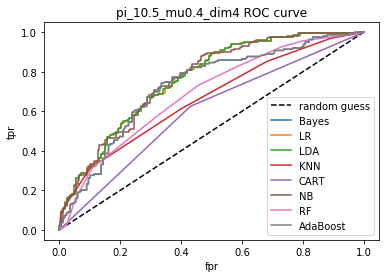

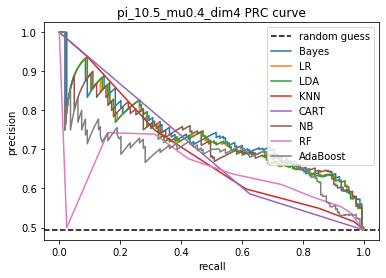

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  AdaBoost
The best model measured by  accuracy is  AdaBoost
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  AdaBoost
The best model measured by  log_loss_score is  AdaBoost
The best model measured by  recall is  AdaBoost
Positive ratio for pi_1 = 0.5 , mu = 0.4 , dim = 6  is 0.481 .
LR : AUROC = 0.774, AUPRC = 0.757, average precision = 0.644,  . 
Best threshold for ROC = 0.464, accuracy for the best ROC threshold is then 0.700, accuracy = 0.715. 
F1 score = 0.682, log loss = 9.838, recall = 0.635.
------------------------------------------------------------
LDA : AUROC = 0.774, AUPRC = 0.757, average precision = 0.644,  . 
Best threshold for ROC = 0.461, accuracy for the best ROC threshold is then 0.700, accuracy = 0.715. 
F1 score = 0.682, log loss = 9.838, recall = 0.635.
------------------------------

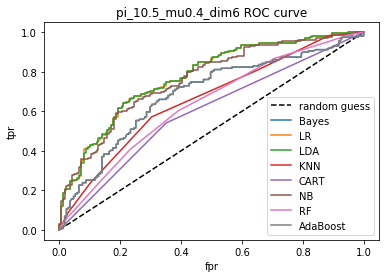

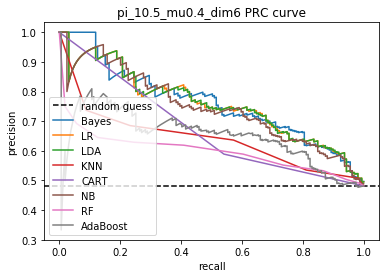

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.5 , mu = 0.4 , dim = 8  is 0.516 .
LR : AUROC = 0.704, AUPRC = 0.720, average precision = 0.603,  . 
Best threshold for ROC = 0.504, accuracy for the best ROC threshold is then 0.639, accuracy = 0.639. 
F1 score = 0.651, log loss = 12.455, recall = 0.653.
------------------------------------------------------------
LDA : AUROC = 0.704, AUPRC = 0.720, average precision = 0.607,  . 
Best threshold for ROC = 0.503, accuracy for the best ROC threshold is then 0.645, accuracy = 0.645. 
F1 score = 0.657, log loss = 12.246, recall = 0.659.
------------------------------------------------------------
KN

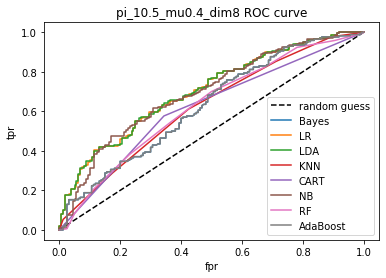

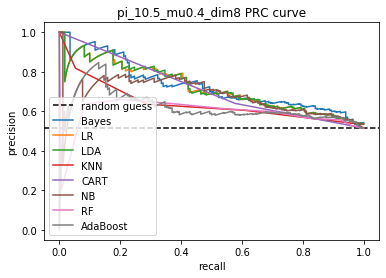

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  LDA
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  NB
Positive ratio for pi_1 = 0.5 , mu = 0.4 , dim = 10  is 0.52 .
LR : AUROC = 0.699, AUPRC = 0.698, average precision = 0.623,  . 
Best threshold for ROC = 0.499, accuracy for the best ROC threshold is then 0.658, accuracy = 0.658. 
F1 score = 0.667, log loss = 11.827, recall = 0.657.
------------------------------------------------------------
LDA : AUROC = 0.700, AUPRC = 0.698, average precision = 0.623,  . 
Best threshold for ROC = 0.500, accuracy for the best ROC threshold is then 0.661, accuracy = 0.658. 
F1 score = 0.667, log loss = 11.827, recall = 0.657.
----------------------------------------------------------

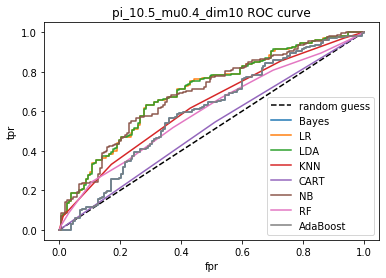

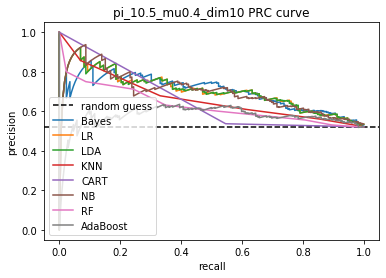

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  LDA
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.5 , mu = 0.6 , dim = 2  is 0.496 .
LR : AUROC = 0.797, AUPRC = 0.778, average precision = 0.658,  . 
Best threshold for ROC = 0.515, accuracy for the best ROC threshold is then 0.715, accuracy = 0.724. 
F1 score = 0.728, log loss = 9.524, recall = 0.744.
------------------------------------------------------------
LDA : AUROC = 0.797, AUPRC = 0.777, average precision = 0.658,  . 
Best threshold for ROC = 0.513, accuracy for the best ROC threshold is then 0.715, accuracy = 0.724. 
F1 score = 0.728, log loss = 9.524, recall = 0.744.
------------------------------------------------------------
KNN

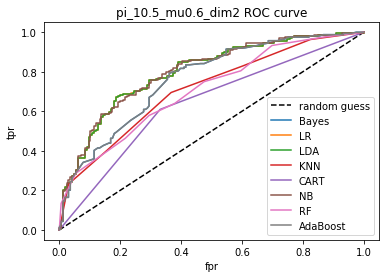

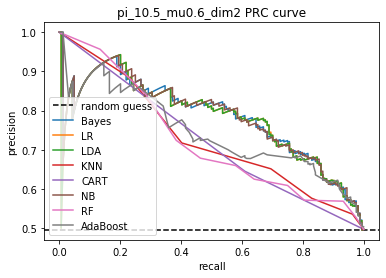

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  NB
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  AdaBoost
Positive ratio for pi_1 = 0.5 , mu = 0.6 , dim = 4  is 0.5 .
LR : AUROC = 0.787, AUPRC = 0.754, average precision = 0.671,  . 
Best threshold for ROC = 0.457, accuracy for the best ROC threshold is then 0.730, accuracy = 0.727. 
F1 score = 0.713, log loss = 9.420, recall = 0.679.
------------------------------------------------------------
LDA : AUROC = 0.787, AUPRC = 0.756, average precision = 0.671,  . 
Best threshold for ROC = 0.462, accuracy for the best ROC threshold is then 0.730, accuracy = 0.727. 
F1 score = 0.713, log loss = 9.420, recall = 0.679.
------------------------------------------------------------
KN

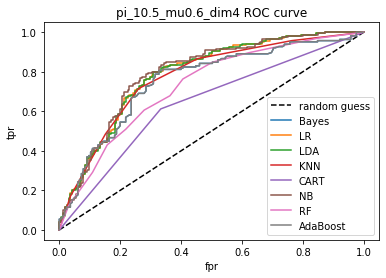

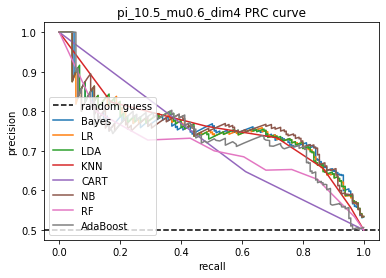

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  KNN
The best model measured by  accuracy_best_threshold is  NB
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  AdaBoost
Positive ratio for pi_1 = 0.5 , mu = 0.6 , dim = 6  is 0.532 .
LR : AUROC = 0.806, AUPRC = 0.803, average precision = 0.704,  . 
Best threshold for ROC = 0.545, accuracy for the best ROC threshold is then 0.733, accuracy = 0.748. 
F1 score = 0.773, log loss = 8.687, recall = 0.801.
------------------------------------------------------------
LDA : AUROC = 0.805, AUPRC = 0.804, average precision = 0.702,  . 
Best threshold for ROC = 0.540, accuracy for the best ROC threshold is then 0.733, accuracy = 0.745. 
F1 score = 0.768, log loss = 8.792, recall = 0.790.
------------------------------------------------------------

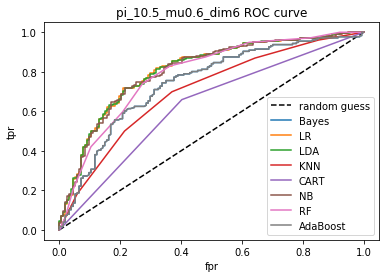

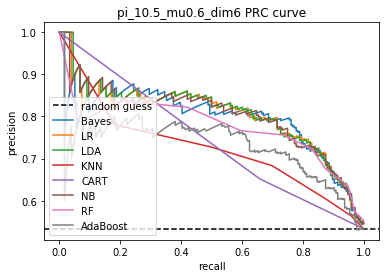

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  NB
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.5 , mu = 0.6 , dim = 8  is 0.487 .
LR : AUROC = 0.786, AUPRC = 0.753, average precision = 0.667,  . 
Best threshold for ROC = 0.469, accuracy for the best ROC threshold is then 0.733, accuracy = 0.736. 
F1 score = 0.722, log loss = 9.106, recall = 0.702.
------------------------------------------------------------
LDA : AUROC = 0.786, AUPRC = 0.753, average precision = 0.667,  . 
Best threshold for ROC = 0.469, accuracy for the best ROC threshold is then 0.730, accuracy = 0.736. 
F1 score = 0.722, log loss = 9.106, recall = 0.702.
------------------------------------------------------------
KNN :

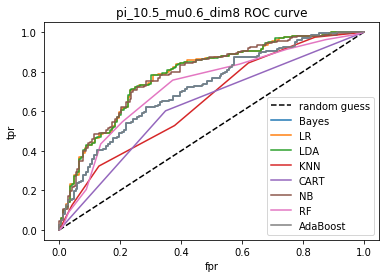

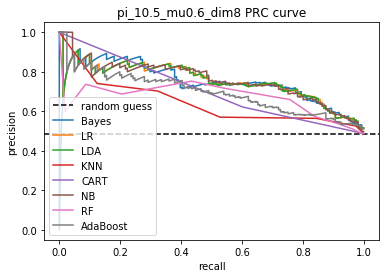

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.5 , mu = 0.6 , dim = 10  is 0.514 .
LR : AUROC = 0.794, AUPRC = 0.785, average precision = 0.660,  . 
Best threshold for ROC = 0.490, accuracy for the best ROC threshold is then 0.715, accuracy = 0.706. 
F1 score = 0.709, log loss = 10.152, recall = 0.694.
------------------------------------------------------------
LDA : AUROC = 0.794, AUPRC = 0.785, average precision = 0.659,  . 
Best threshold for ROC = 0.499, accuracy for the best ROC threshold is then 0.706, accuracy = 0.706. 
F1 score = 0.710, log loss = 10.152, recall = 0.700.
------------------------------------------------------------
KNN

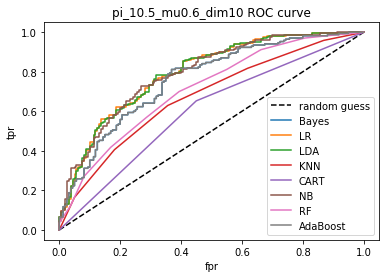

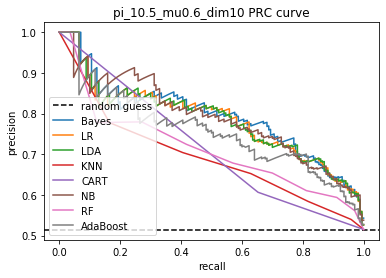

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  NB
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  AdaBoost
Positive ratio for pi_1 = 0.5 , mu = 0.8 , dim = 2  is 0.519 .
LR : AUROC = 0.868, AUPRC = 0.879, average precision = 0.730,  . 
Best threshold for ROC = 0.503, accuracy for the best ROC threshold is then 0.779, accuracy = 0.779. 
F1 score = 0.786, log loss = 7.640, recall = 0.784.
------------------------------------------------------------
LDA : AUROC = 0.869, AUPRC = 0.879, average precision = 0.730,  . 
Best threshold for ROC = 0.509, accuracy for the best ROC threshold is then 0.782, accuracy = 0.779. 
F1 score = 0.786, log loss = 7.640, recall = 0.784.
------------------------------------------------------------


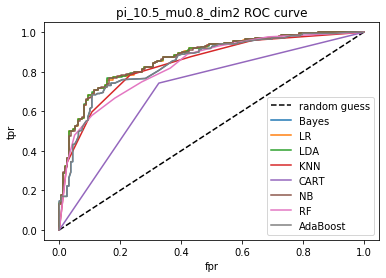

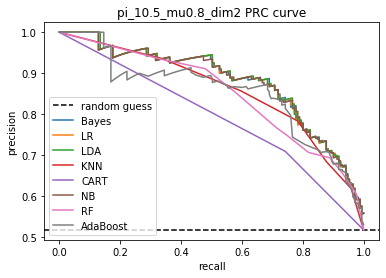

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  NB
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  NB
Positive ratio for pi_1 = 0.5 , mu = 0.8 , dim = 4  is 0.532 .
LR : AUROC = 0.883, AUPRC = 0.875, average precision = 0.780,  . 
Best threshold for ROC = 0.532, accuracy for the best ROC threshold is then 0.818, accuracy = 0.821. 
F1 score = 0.834, log loss = 6.175, recall = 0.841.
------------------------------------------------------------
LDA : AUROC = 0.884, AUPRC = 0.875, average precision = 0.780,  . 
Best threshold for ROC = 0.541, accuracy for the best ROC threshold is then 0.818, accuracy = 0.821. 
F1 score = 0.834, log loss = 6.175, recall = 0.841.
-----------------------------------------------------------

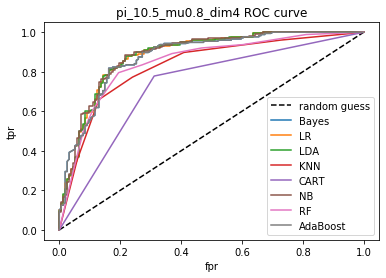

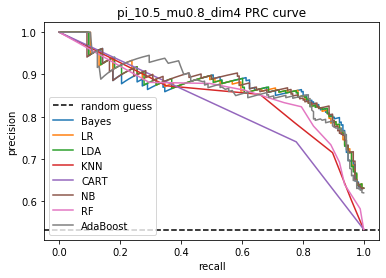

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  AdaBoost
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  NB
Positive ratio for pi_1 = 0.5 , mu = 0.8 , dim = 6  is 0.494 .
LR : AUROC = 0.866, AUPRC = 0.847, average precision = 0.724,  . 
Best threshold for ROC = 0.496, accuracy for the best ROC threshold is then 0.794, accuracy = 0.788. 
F1 score = 0.784, log loss = 7.326, recall = 0.779.
------------------------------------------------------------
LDA : AUROC = 0.866, AUPRC = 0.846, average precision = 0.717,  . 
Best threshold for ROC = 0.497, accuracy for the best ROC threshold is then 0.782, accuracy = 0.782. 
F1 score = 0.778, log loss = 7.536, recall = 0.773.
------------------------------------------------------------


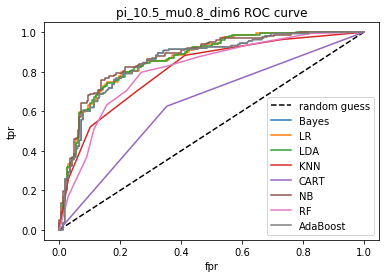

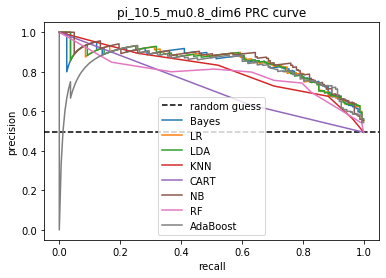

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  AdaBoost
Positive ratio for pi_1 = 0.5 , mu = 0.8 , dim = 8  is 0.493 .
LR : AUROC = 0.865, AUPRC = 0.849, average precision = 0.722,  . 
Best threshold for ROC = 0.472, accuracy for the best ROC threshold is then 0.788, accuracy = 0.785. 
F1 score = 0.779, log loss = 7.431, recall = 0.767.
------------------------------------------------------------
LDA : AUROC = 0.865, AUPRC = 0.850, average precision = 0.719,  . 
Best threshold for ROC = 0.466, accuracy for the best ROC threshold is then 0.791, accuracy = 0.782. 
F1 score = 0.775, log loss = 7.536, recall = 0.761.
------------------------------------------------------------


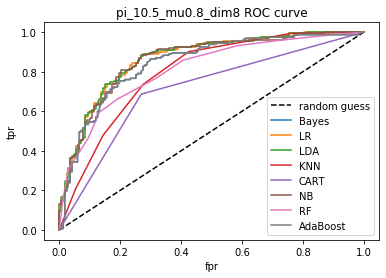

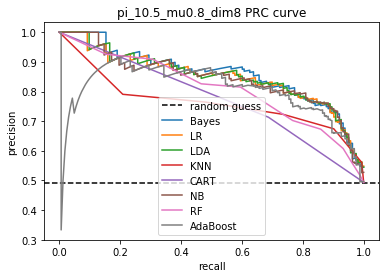

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  NB
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.5 , mu = 0.8 , dim = 10  is 0.481 .
LR : AUROC = 0.848, AUPRC = 0.837, average precision = 0.691,  . 
Best threshold for ROC = 0.481, accuracy for the best ROC threshold is then 0.764, accuracy = 0.767. 
F1 score = 0.757, log loss = 8.059, recall = 0.755.
------------------------------------------------------------
LDA : AUROC = 0.849, AUPRC = 0.837, average precision = 0.691,  . 
Best threshold for ROC = 0.497, accuracy for the best ROC threshold is then 0.767, accuracy = 0.767. 
F1 score = 0.759, log loss = 8.059, recall = 0.761.
------------------------------------------------------------
KNN

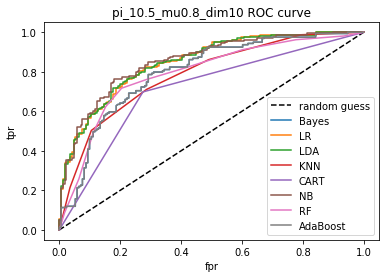

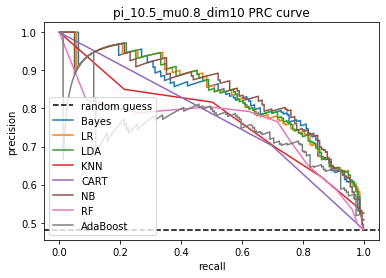

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  NB
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  NB
Positive ratio for pi_1 = 0.5 , mu = 1 , dim = 2  is 0.509 .
LR : AUROC = 0.915, AUPRC = 0.922, average precision = 0.781,  . 
Best threshold for ROC = 0.527, accuracy for the best ROC threshold is then 0.833, accuracy = 0.833. 
F1 score = 0.838, log loss = 5.757, recall = 0.845.
------------------------------------------------------------
LDA : AUROC = 0.916, AUPRC = 0.922, average precision = 0.781,  . 
Best threshold for ROC = 0.521, accuracy for the best ROC threshold is then 0.830, accuracy = 0.833. 
F1 score = 0.838, log loss = 5.757, recall = 0.845.
------------------------------------------------------------
KNN : AU

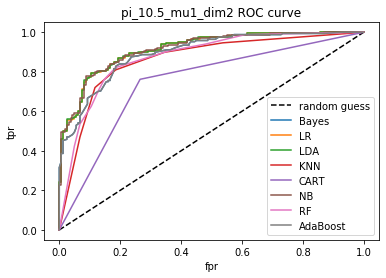

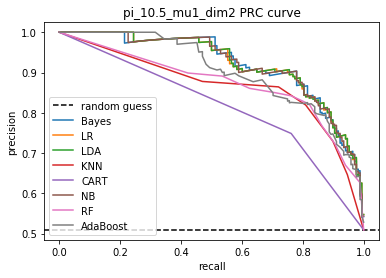

The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.5 , mu = 1 , dim = 4  is 0.486 .
LR : AUROC = 0.932, AUPRC = 0.923, average precision = 0.822,  . 
Best threshold for ROC = 0.468, accuracy for the best ROC threshold is then 0.876, accuracy = 0.873. 
F1 score = 0.867, log loss = 4.396, recall = 0.856.
------------------------------------------------------------
LDA : AUROC = 0.931, AUPRC = 0.923, average precision = 0.827,  . 
Best threshold for ROC = 0.448, accuracy for the best ROC threshold is then 0.876, accuracy = 0.876. 
F1 score = 0.870, log loss = 4.291, recall = 0.856.
------------------------------------------------------------
KNN : 

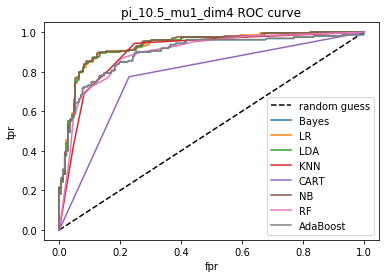

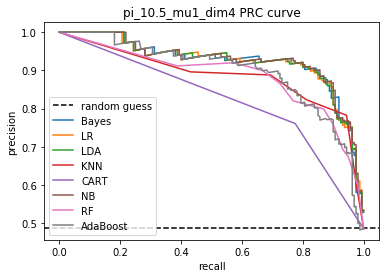

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.5 , mu = 1 , dim = 6  is 0.547 .
LR : AUROC = 0.911, AUPRC = 0.931, average precision = 0.786,  . 
Best threshold for ROC = 0.531, accuracy for the best ROC threshold is then 0.800, accuracy = 0.815. 
F1 score = 0.830, log loss = 6.385, recall = 0.823.
------------------------------------------------------------
LDA : AUROC = 0.911, AUPRC = 0.930, average precision = 0.789,  . 
Best threshold for ROC = 0.547, accuracy for the best ROC threshold is then 0.809, accuracy = 0.821. 
F1 score = 0.837, log loss = 6.175, recall = 0.840.
------------------------------------------------------------
KNN : AU

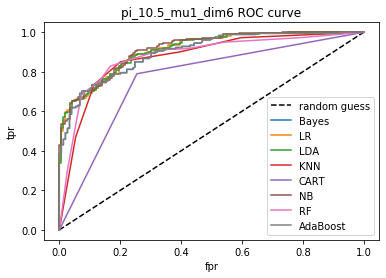

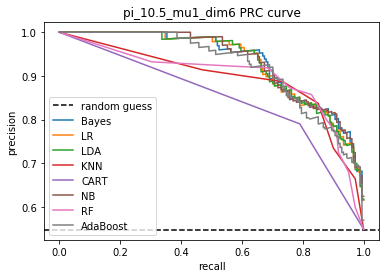

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  NB
The best model measured by  accuracy is  RF
The best model measured by  average_precision is  RF
The best model measured by  f1 is  KNN
The best model measured by  log_loss_score is  RF
The best model measured by  recall is  KNN
Positive ratio for pi_1 = 0.5 , mu = 1 , dim = 8  is 0.497 .
LR : AUROC = 0.899, AUPRC = 0.881, average precision = 0.770,  . 
Best threshold for ROC = 0.499, accuracy for the best ROC threshold is then 0.827, accuracy = 0.827. 
F1 score = 0.826, log loss = 5.966, recall = 0.823.
------------------------------------------------------------
LDA : AUROC = 0.900, AUPRC = 0.883, average precision = 0.768,  . 
Best threshold for ROC = 0.506, accuracy for the best ROC threshold is then 0.827, accuracy = 0.827. 
F1 score = 0.827, log loss = 5.966, recall = 0.829.
------------------------------------------------------------
KNN : 

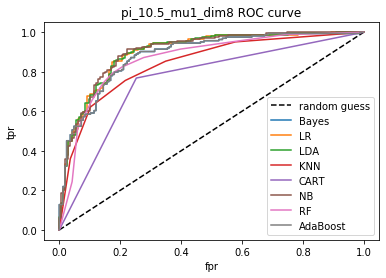

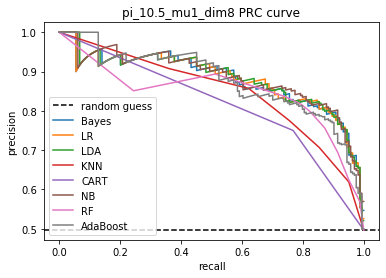

The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  NB
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  NB
Positive ratio for pi_1 = 0.5 , mu = 1 , dim = 10  is 0.498 .
LR : AUROC = 0.933, AUPRC = 0.934, average precision = 0.809,  . 
Best threshold for ROC = 0.470, accuracy for the best ROC threshold is then 0.858, accuracy = 0.858. 
F1 score = 0.854, log loss = 4.919, recall = 0.841.
------------------------------------------------------------
LDA : AUROC = 0.932, AUPRC = 0.934, average precision = 0.811,  . 
Best threshold for ROC = 0.461, accuracy for the best ROC threshold is then 0.852, accuracy = 0.858. 
F1 score = 0.854, log loss = 4.919, recall = 0.835.
------------------------------------------------------------
KNN : A

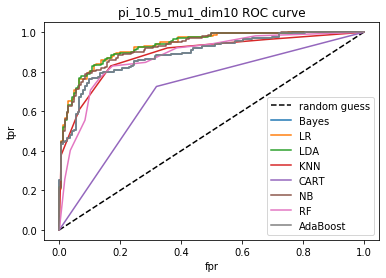

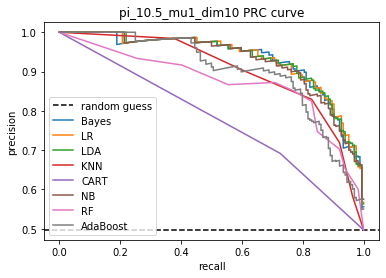

The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  LR


In [91]:
# can tune parameters here and see different results
for pi_1 in [0.1, 0.2, 0.3, 0.4, 0.5]:
    for mu in [0.2, 0.4, 0.6, 0.8, 1]:
        for dim in [2, 4, 6, 8, 10]:
            simulation_results(pi_1, mu, dim, N = 1000)